In [ ]:
# Script that creates video gifs for the video - for both the images and the tactile


In [1]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import pickle
import os
import torch
import torchvision.transforms as T
import torch.nn.functional as F
import random
from copy import deepcopy as copy

from tactile_learning.models.knn import KNearestNeighbors
from torchvision.datasets.folder import default_loader as loader
from tactile_learning.utils.constants import *
from tactile_learning.utils.augmentations import get_tactile_augmentations
from tactile_learning.utils.constants import *
from tactile_learning.utils.data import load_data

augment_fn = augment_fn = get_tactile_augmentations(
    img_means = TACTILE_IMAGE_MEANS,
    img_stds = TACTILE_IMAGE_STDS,
    img_size = (224, 224)
)


np_means = np.asarray(VISION_IMAGE_MEANS)
np_stds = np.asarray(VISION_IMAGE_STDS)

inv_image_transform = T.Compose([
    T.Resize((480,640)),
    T.Normalize(mean = [0,0,0], std = 1 / np_stds ), 
    T.Normalize(mean = -np_means, std = [1,1,1])
])

In [2]:
def load_dataset_image(demo_id, image_id, view_num=1, data_path='/home/irmak/Workspace/Holo-Bot/extracted_data/book_opening/eval'):
    roots = glob.glob(f'{data_path}/demonstration_*')
    roots = sorted(roots)
    image_root = roots[demo_id]
    image_path = os.path.join(image_root, 'cam_{}_rgb_images/frame_{}.png'.format(view_num, str(image_id).zfill(5)))
    img = loader(image_path)
    img = T.Resize((480,640))(img)
    img = T.ToTensor()(img).permute(1,2,0) # We don't have to do these for this particular thinb
    return img.numpy()

In [3]:
def plot_tactile_sensor(ax, sensor_values, use_img=False, img=None, title='Tip Position'):
    # sensor_values: (16, 3) - 3 values for each tactile - x and y represents the position, z represents the pressure on the tactile point
    img_shape = (240, 240, 3) # For one sensor
    blank_image = np.ones(img_shape, np.uint8) * 255
    if use_img == False: 
        img = ax.imshow(blank_image.copy())

    # Set the coordinates for each circle
    tactile_coordinates = []
    for j in range(48, 192+1, 48): # Y
        for i in range(48, 192+1, 48): # X - It goes from top left to bottom right row first 
            tactile_coordinates.append([i,j])

    # Plot the circles
    min_sensor = sensor_values.min()

    for i in range(sensor_values.shape[0]):
        center_coordinates = (
            tactile_coordinates[i][0] + int(sensor_values[i,0]/20), # NOTE: Change this
            tactile_coordinates[i][1] + int(sensor_values[i,1]/20)
        )

        radius = max(2, int(np.sqrt(sensor_values[i,2] - min_sensor)))
      
        if i == 0:
            frame_axis = cv2.circle(blank_image.copy(), center_coordinates, radius, color=(0,255,0), thickness=-1)
        else:
            frame_axis = cv2.circle(frame_axis.copy(), center_coordinates, radius, color=(0,255,0), thickness=-1)

    img.set_array(frame_axis)

    return img, frame_axis

In [10]:
def plot_tactile_state(tactile_values, small_tactile=False, tactile_pad_ids=[(2,0),(3,0),(2,1),(2,2)]):
    if not small_tactile:
        fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(10,10))
        for col_id in range(4):
            for row_id in range(4):
                if col_id + row_id > 0:
                    plot_tactile_sensor(
                        ax = axs[row_id, col_id],
                        sensor_values = tactile_values[col_id*4+row_id-1],
                        title=f'Finger: {col_id}, Sensor: {row_id}'
                    )
                axs[row_id, col_id].get_yaxis().set_ticks([])
                axs[row_id, col_id].get_xaxis().set_ticks([])
    else:
        fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
        axs_row = 0 
        axs_col = 0
        i = 0
        for col_id in range(4):
            for row_id in range(4):
                if (col_id == tactile_pad_ids[0][0] and row_id == tactile_pad_ids[0][1]) or \
                   (col_id == tactile_pad_ids[1][0] and row_id == tactile_pad_ids[1][1]) or \
                   (col_id == tactile_pad_ids[2][0] and row_id == tactile_pad_ids[2][1]) or \
                   (col_id == tactile_pad_ids[3][0] and row_id == tactile_pad_ids[3][1]):
                    axs_row = i % 2
                    axs_col = int(i / 2)
                    plot_tactile_sensor(
                        ax = axs[axs_row, axs_col],
                        sensor_values = tactile_values[col_id*4+row_id-1],
                        title=f'Finger: {col_id}, Sensor: {row_id}'
                    )
                    axs[axs_row][axs_col].get_yaxis().set_ticks([])
                    axs[axs_row][axs_col].get_xaxis().set_ticks([])
                    i += 1
    # plt.show()
    return fig 

In [5]:
def get_data_with_id_for_visualization(id, data_path, data=None, view_num=1):
    if data is None:
        roots = glob.glob(f'{data_path}/demonstration_*')
        data = load_data(roots, demos_to_use=[])
    demo_id, tactile_id = data['tactile']['indices'][id]
    _, allegro_tip_id = data['allegro_tip_states']['indices'][id]
    _, kinova_id = data['kinova']['indices'][id]
    _, image_id = data['image']['indices'][id]
    tactile_values = data['tactile']['values'][demo_id][tactile_id]
    # tactile_image = get_tactile_image_for_visualization(tactile_values)
    allegro_finger_tip_pos = data['allegro_tip_states']['values'][demo_id][allegro_tip_id]
    kinova_cart_pos = data['kinova']['values'][demo_id][kinova_id][:3]
    image = load_dataset_image(demo_id, image_id, view_num=view_num, data_path=data_path)
    # image_cv2 = cv2.cvtColor(image*255, cv2.COLOR_RGB2BGR)

    visualization_data = dict(
        image = image,
        kinova = kinova_cart_pos, 
        allegro = allegro_finger_tip_pos, 
        tactile_values = tactile_values,
        # tactile_image = tactile_image
    )

    return visualization_data, data

In [6]:
def get_neighbor_ids(deployment_info, state_id, k=10):
    all_representations = deployment_info['all_representations']
    curr_representation = deployment_info['curr_representations'][state_id]
    knn = KNearestNeighbors(all_representations, all_representations)
    _, ids = knn.get_k_nearest_neighbors(curr_representation,k=k)
    return ids

In [7]:
deployment_data_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/bottle_cap_opening/demo_images/image/1'
with open(os.path.join(deployment_data_dir, 'deployment_info.pkl'), 'rb') as f: 
    deployment_info = pickle.load(f)

neighbor_id = deployment_info['neighbor_ids'][15]
neighbor_vis_data, data = get_data_with_id_for_visualization(
    data_path = '/data/tactile_learning/bottle_cap_opening/eval',
    id = neighbor_id)

FileNotFoundError: [Errno 2] No such file or directory: '/home/irmak/Workspace/Holo-Bot/deployment_data/bottle_cap_opening/demo_images/image/1/deployment_info.pkl'

In [8]:
print(neighbor_id)

NameError: name 'neighbor_id' is not defined

In [9]:
import io

def save_ax_nosave(ax, **kwargs):
    # ax.axis("off")
    ax.figure.canvas.draw()
    trans = ax.figure.dpi_scale_trans.inverted() 
    bbox = ax.bbox.transformed(trans)
    buff = io.BytesIO()
    plt.savefig(buff, format="png", dpi=ax.figure.dpi, bbox_inches=bbox,  **kwargs)
    # ax.axis("on")
    buff.seek(0)
    im = plt.imread(buff )
    return im

In [ ]:
def get_data_for_visualization(data_path, data=None, view_num=1):
    if data is None:
        roots = glob.glob(f'{data_path}/demonstration_*')
        data = load_data(roots, demos_to_use=[])
    demo_id, tactile_id = data['tactile']['indices']
    _, allegro_tip_id = data['allegro_tip_states']['indices']
    _, kinova_id = data['kinova']['indices']
    _, image_id = data['image']['indices']
    tactile_values = data['tactile']['values'][demo_id][tactile_id]
    allegro_finger_tip_pos = data['allegro_tip_states']['values'][demo_id][allegro_tip_id]
    kinova_cart_pos = data['kinova']['values'][demo_id][kinova_id][:3]
    image = load_dataset_image(demo_id, image_id, view_num=view_num, data_path=data_path)

    visualization_data = dict(
        image = image,
        kinova = kinova_cart_pos, 
        allegro = allegro_finger_tip_pos, 
        tactile_values = tactile_values,
    )

    return visualization_data, data

In [17]:
import matplotlib
matplotlib.use('Agg')

images = []
data_path = '/home/irmak/Workspace/Holo-Bot/extracted_data/tactile_reading'
roots = roots = glob.glob(f'{data_path}/demonstration_*')
sponge_flipping_data = load_data(roots, demos_to_use=[9])

for (demo_id, tactile_id) in sponge_flipping_data['tactile']['indices']:

    # demo_id, tactile_id = sponge_flipping_data['tactile']['indices'][i]
    tactile_values = sponge_flipping_data['tactile']['values'][demo_id][tactile_id]

    # neighbor_id = deployment_info['neighbor_ids'][i*5]
    # vis_data, _ = get_data_with_id_for_visualization(
    #     id = neighbor_id,
    #     data = data,
    #     data_path = '/data/tactile_learning/bottle_cap_opening/eval'
    # )
    # print(vis_data['image'].shape)
    # images.append(vis_data['image'])
    
    
    axs = plot_tactile_state(tactile_values, True, tactile_pad_ids=[(0,0),(2,0),(3,0),(2,2)])
    axs_im = save_ax_nosave(axs)
    images.append(axs_im)
    
imageio.mimsave('sponge_flipping_success.gif', images)

# for i in range(5):
    

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

In [12]:
class GIFMaker:
    def __init__(
        self, 
        demonstration_data_path=None, 
        deployment_info_dir=None,
    ):
        # These values will be none with the accordance 
        if demonstration_data_path is not None:
            self.demonstration_data_path = demonstration_data_path 
            roots = glob.glob(f'{demonstration_data_path}/demonstration_*')
            self.demo_data = load_data(roots, demos_to_use=[])

        # deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/bottle_cap_opening/demo_images/image/1'
        if deployment_info_dir is not None:
            with open(os.path.join(deployment_info_dir, 'deployment_info.pkl'), 'rb') as f: 
                self.deployment_info = pickle.load(f)
            
    def make_demo_image_gifs(self, frame_ids, gif_name, view_num, duration=0.1): # Uses the frame ids given
        images = []
        for frame_id in frame_ids:
            vis_data,_ = get_data_with_id_for_visualization (
                id = frame_id, # These are the 
                data = self.demo_data,
                data_path = self.demonstration_data_path,
                view_num = view_num
            )
            # print(vis_data['image'].shape)
            images.append(vis_data['image'])
        imageio.mimsave(gif_name, images, duration=duration)
        
    def make_deployment_image_gifs(self, frame_ids, gif_name, duration=0.1):
        images = [] 
        for frame_id in frame_ids: 
            image = inv_image_transform(self.deployment_info['images'][frame_id])
            image = image.numpy().transpose(1,2,0)
            # image_cv2 = cv2.cvtColor(image*255, cv2.COLOR_RGB2BGR)
            # plt.imshow(image)
            # print(image.shape)
            images.append(image)
        
        imageio.mimsave(gif_name, images, duration=duration)
        
    def make_demo_tactile_gifs(self, frame_ids, gif_name, view_num, tactile_pad_ids=[(0,1), (1,0), (2,0), (3,0)], duration=0.1): 
        images = []
        for frame_id in frame_ids:
            vis_data,_ = get_data_with_id_for_visualization(
                id = frame_id, # These are the 
                data = self.demo_data,
                data_path = self.demonstration_data_path,
                view_num = view_num
            )
            fig = plot_tactile_state(vis_data['tactile_values'], True, tactile_pad_ids)
            fig_im = save_ax_nosave(fig)
            images.append(fig_im)
            
        imageio.mimsave(gif_name, images, duration=duration)
        
    def make_deployment_tactile_gifs(self, frame_ids, gif_name, tactile_pad_ids=[(0,1), (1,0), (2,0), (3,0)], duration=0.1):
        images = [] 
        for frame_id in frame_ids: 
            fig = plot_tactile_state(self.deployment_info['tactile_values'][frame_id], True, tactile_pad_ids)
            fig_im = save_ax_nosave(fig)
            images.append(fig_im)
        
        imageio.mimsave(gif_name, images, duration=duration)
        

/tmp/ipykernel_3437669/2380096398.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this

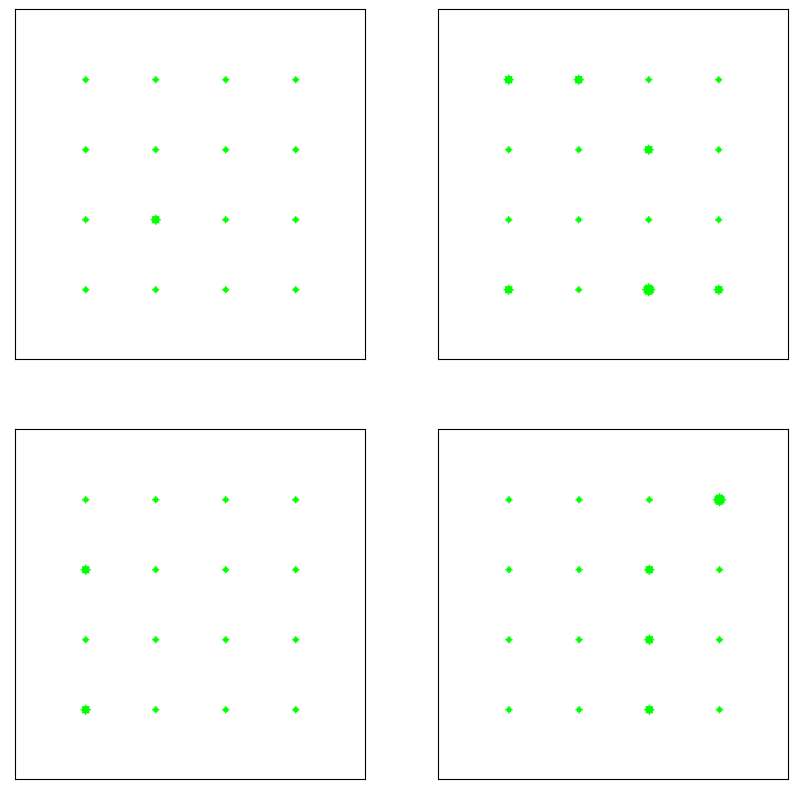

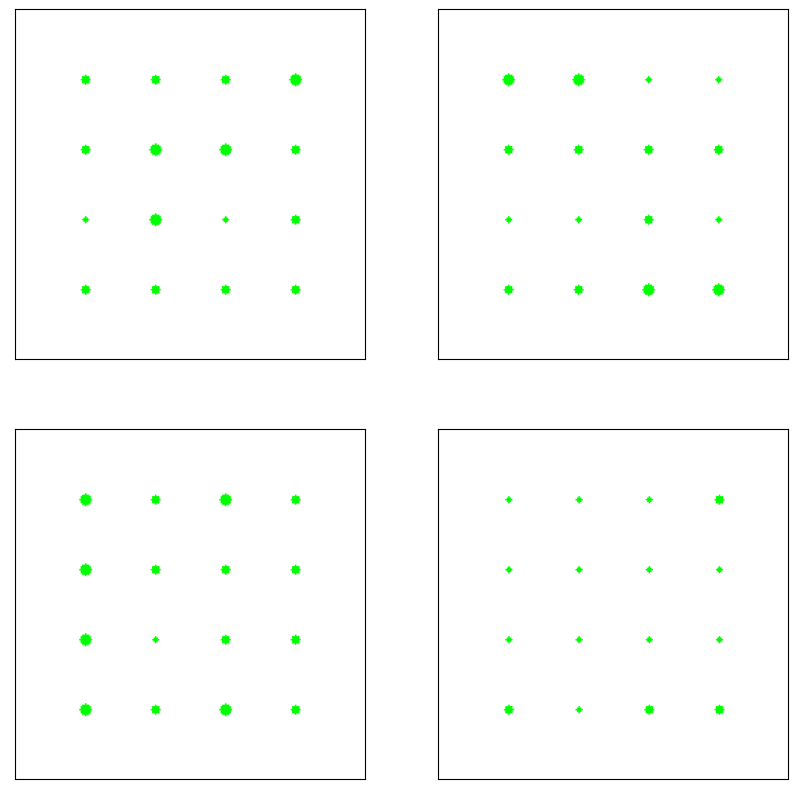

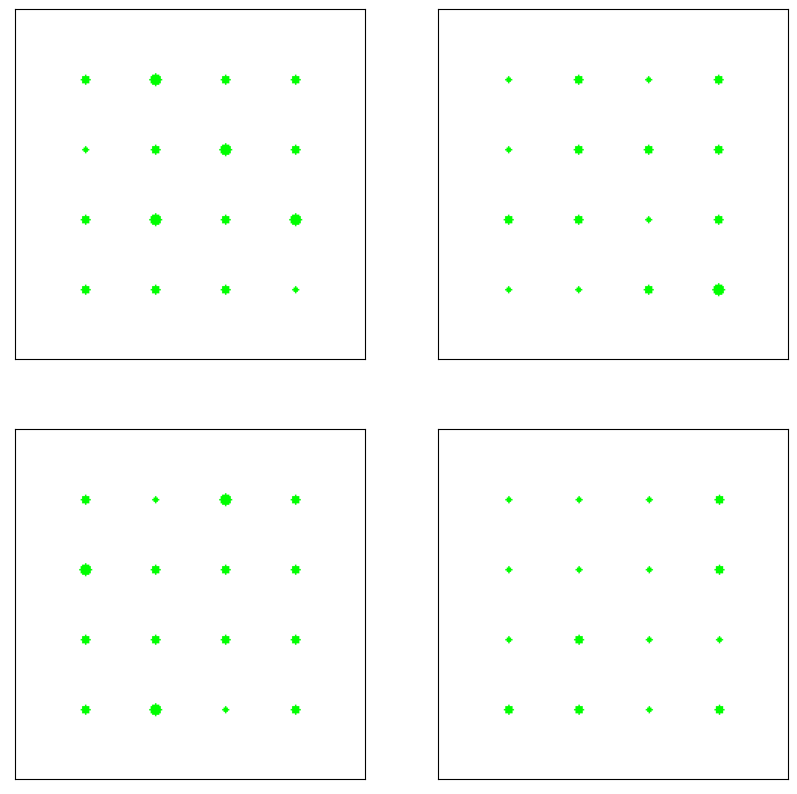

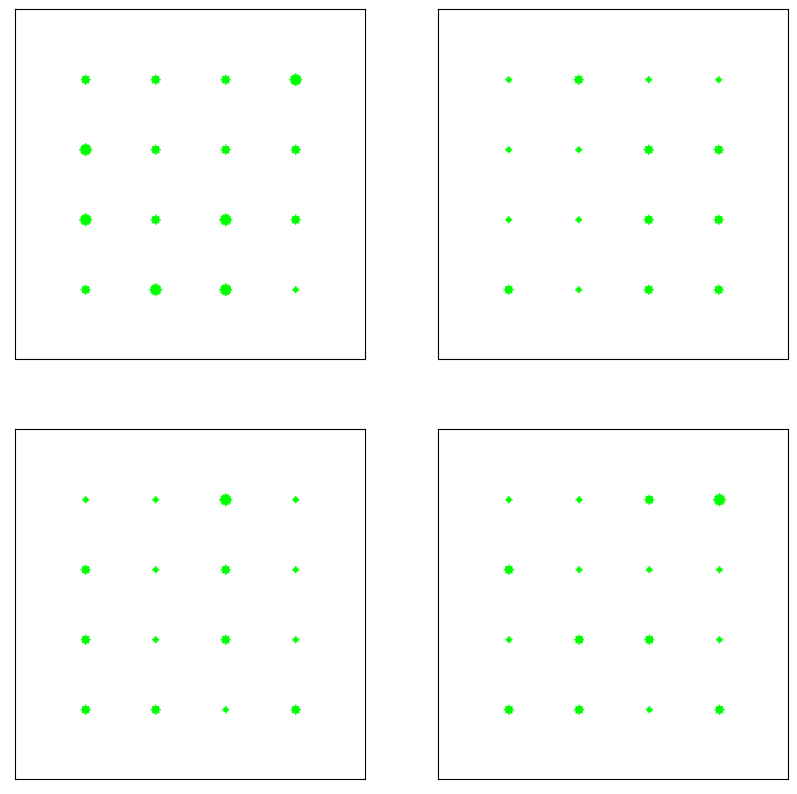

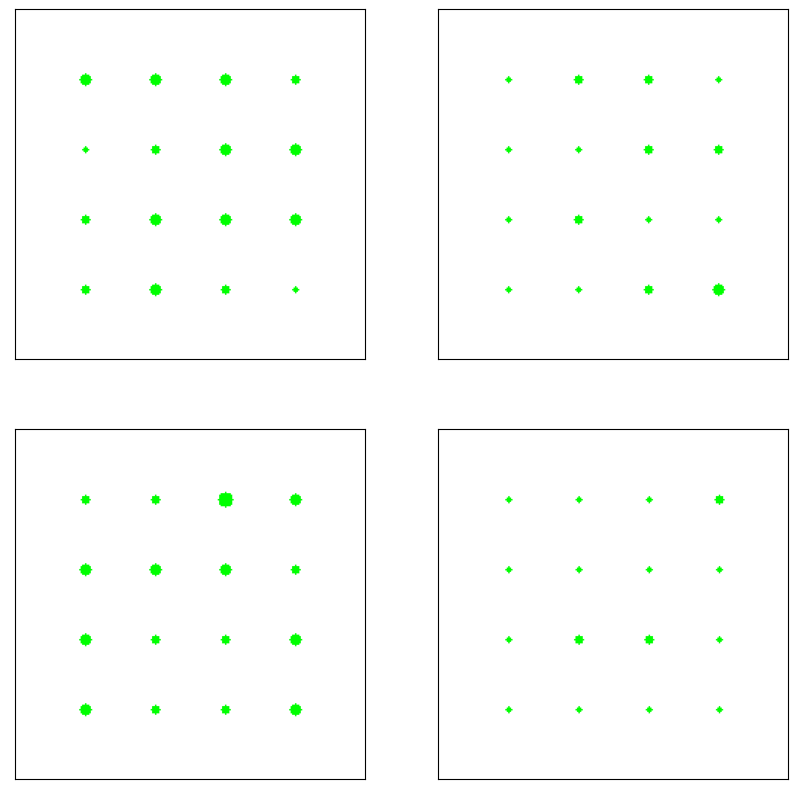

...

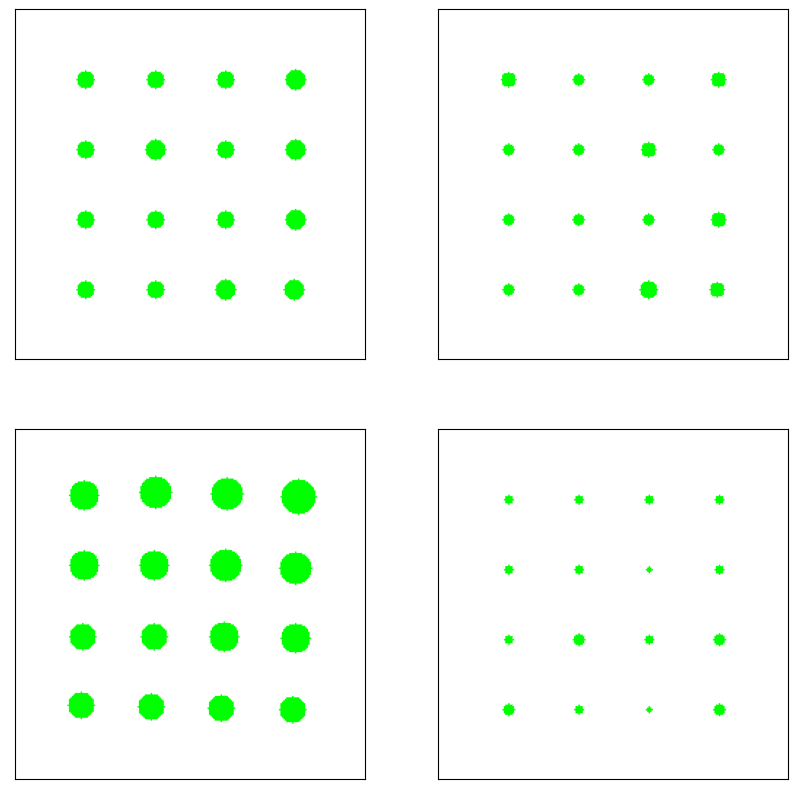

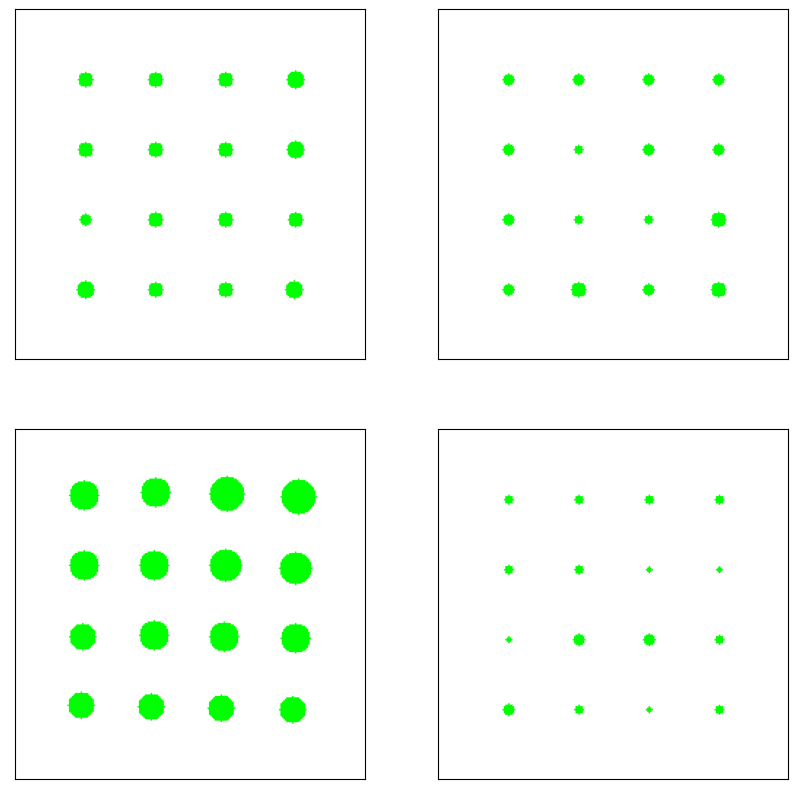

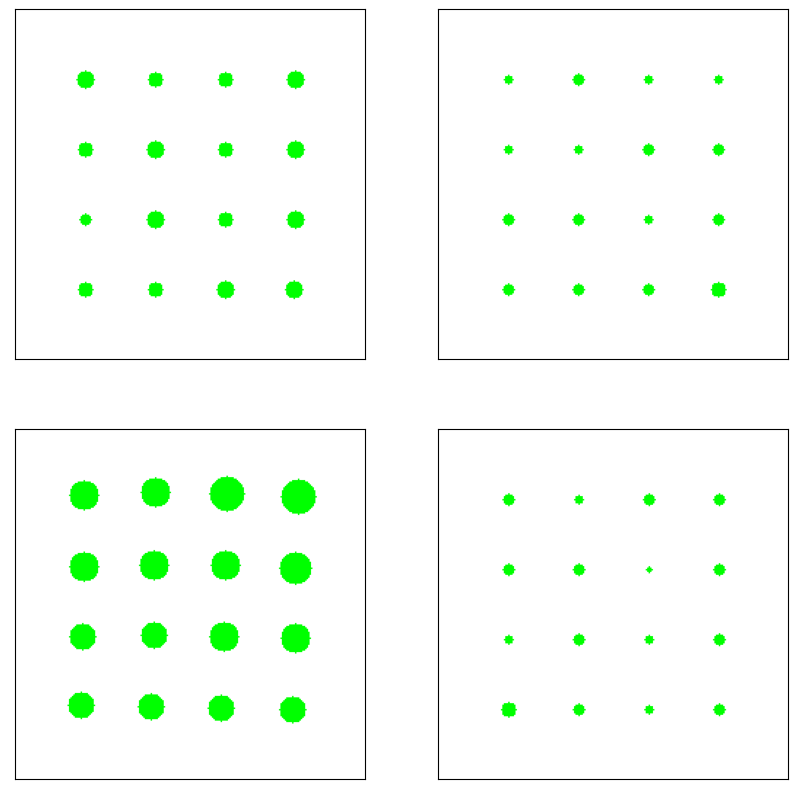

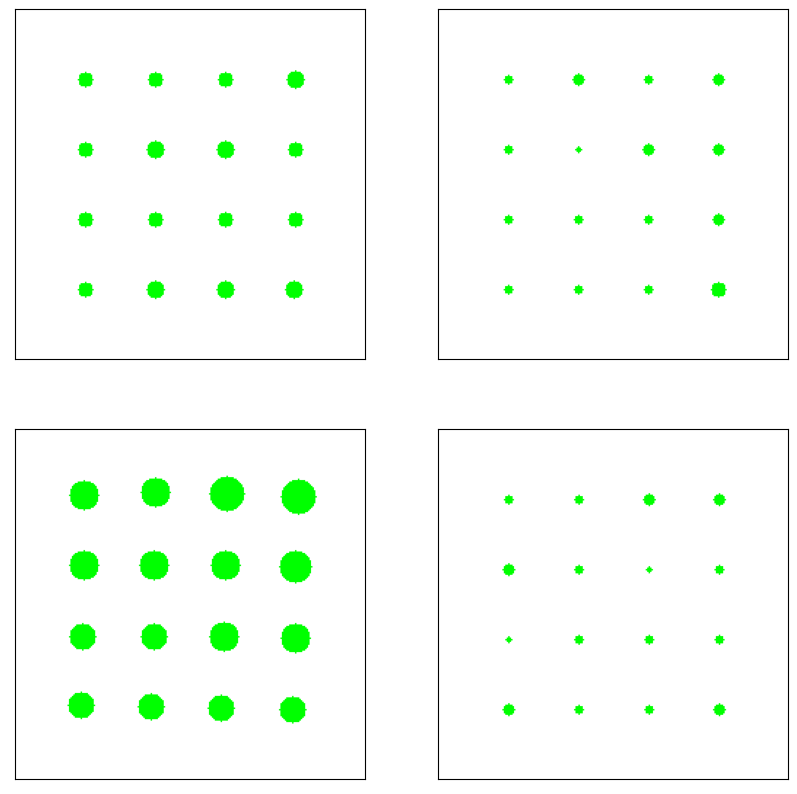

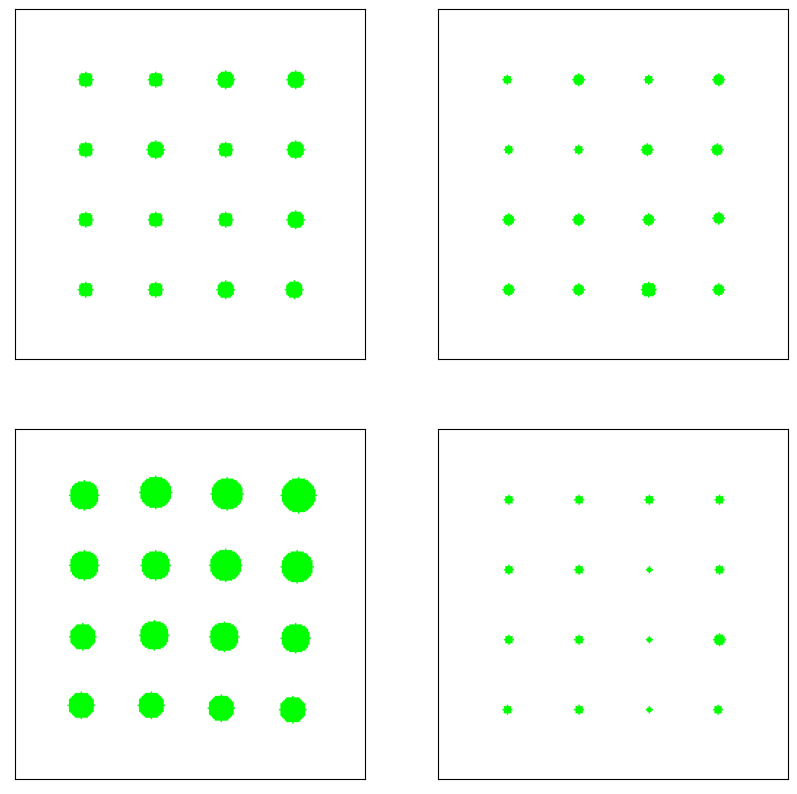

In [13]:
gif_maker = GIFMaker(
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/image_tactile_play/4'
)
cup_tactile_pad_ids = [(0,1),(1,0),(2,0),(3,0)]
gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(0,82),
    gif_name='cup_picking_tdex_rollout.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
    duration=22./82.
)

/tmp/ipykernel_3437669/2380096398.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this

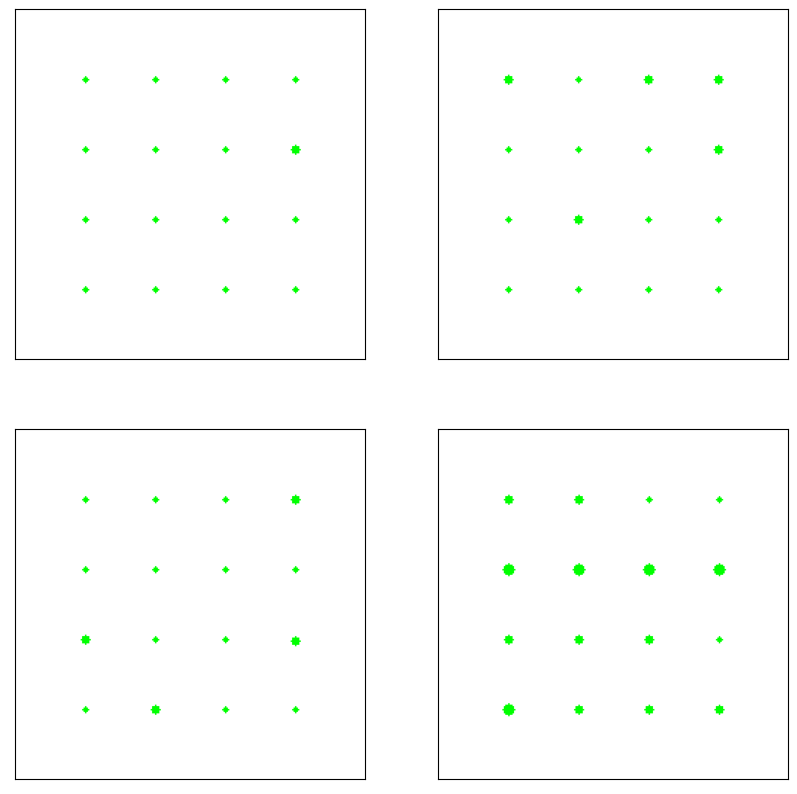

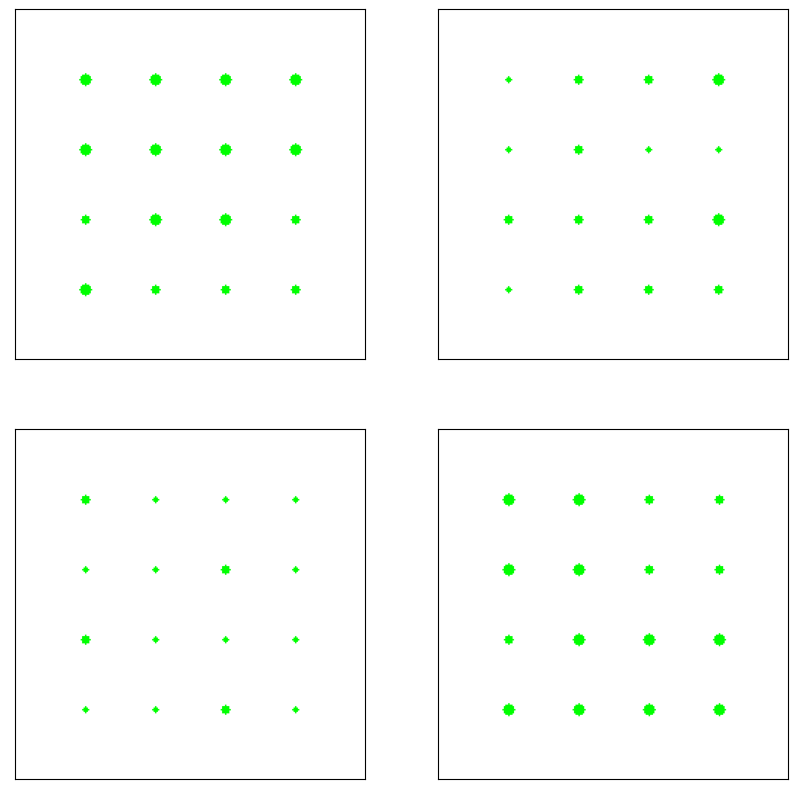

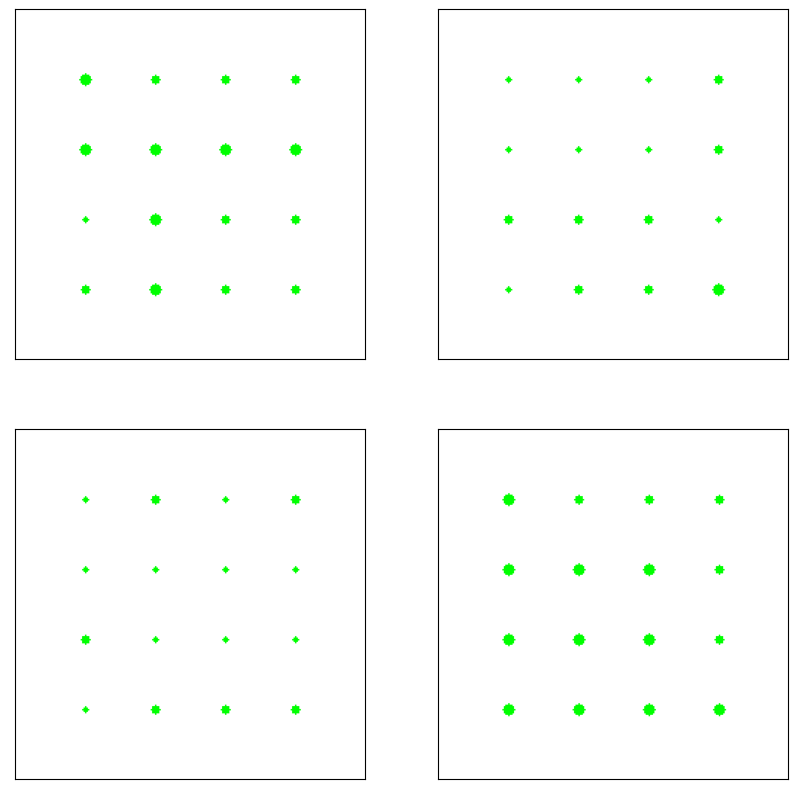

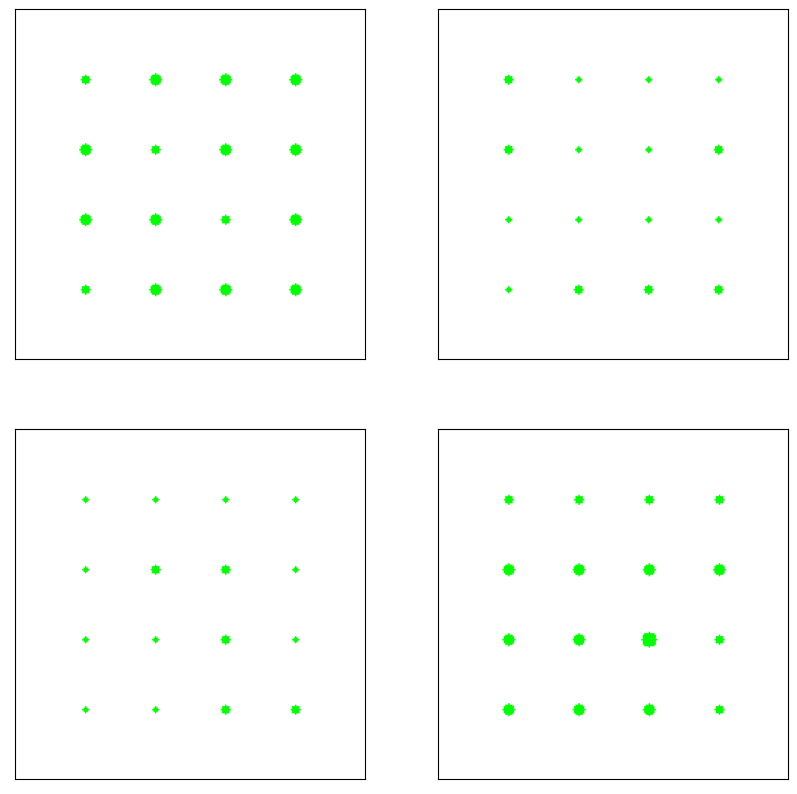

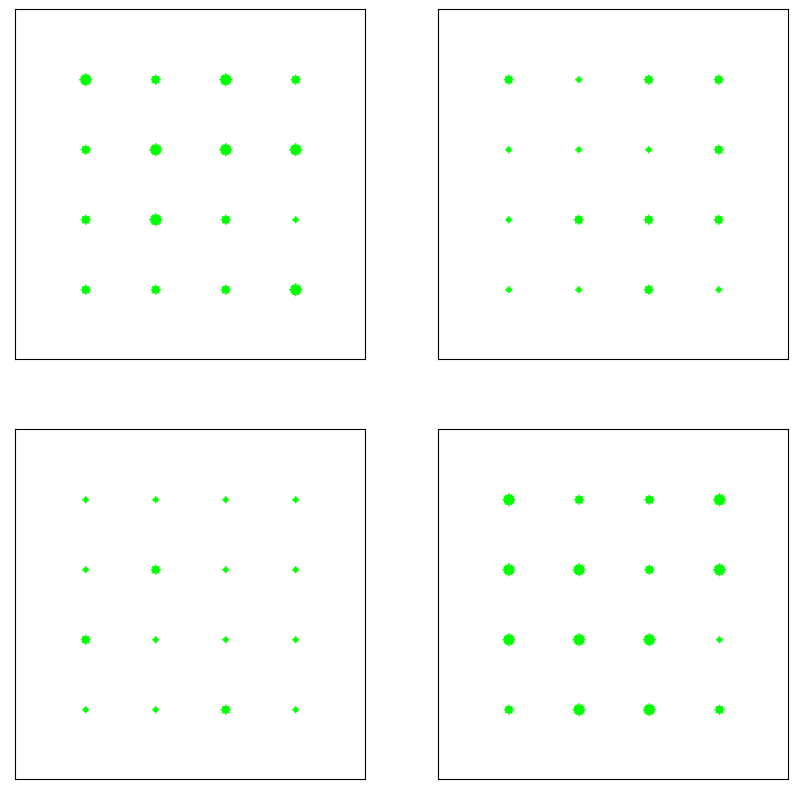

...

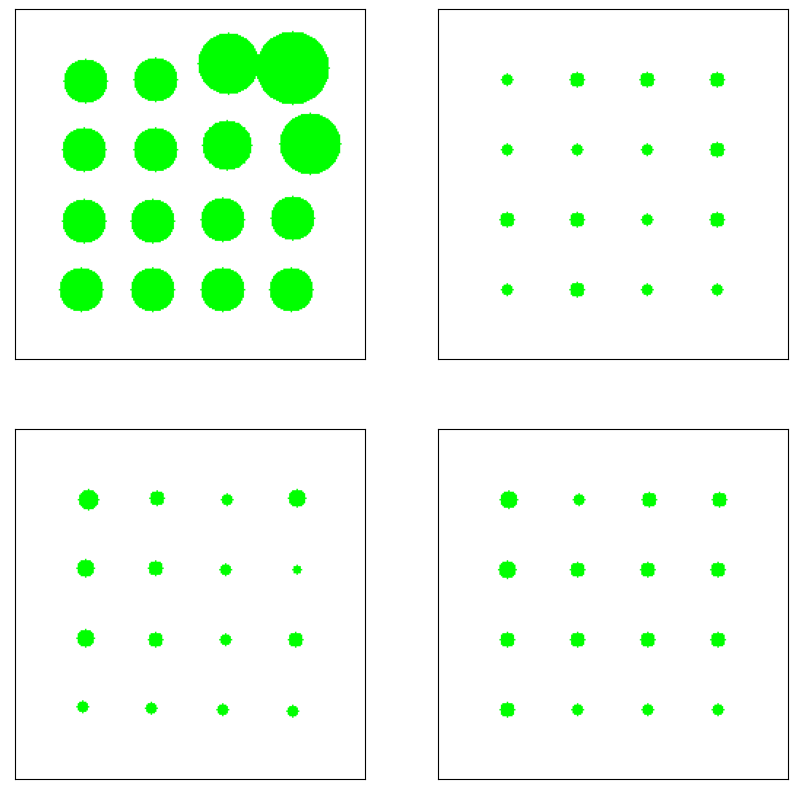

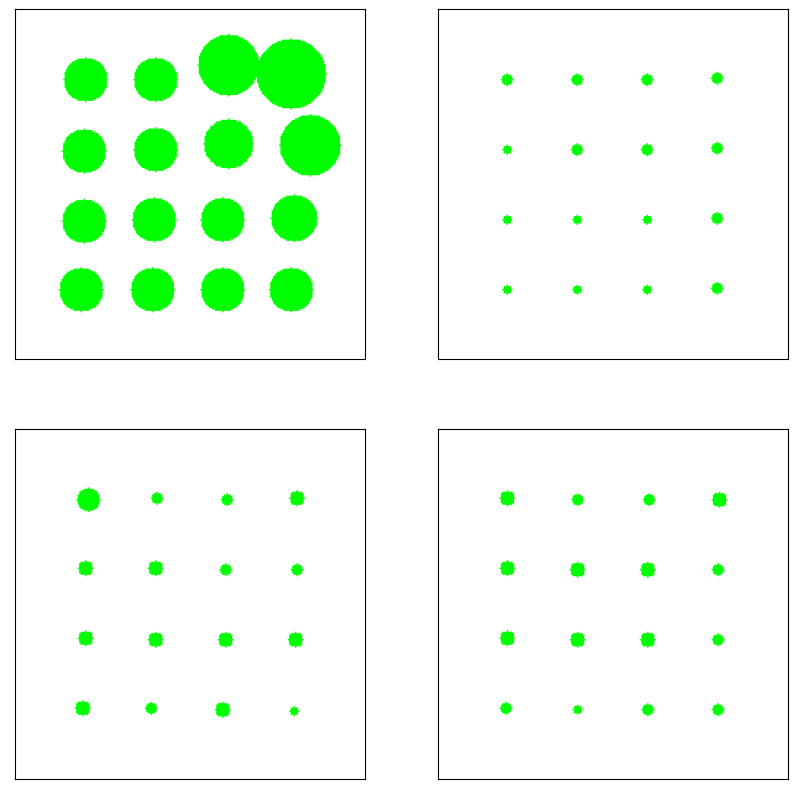

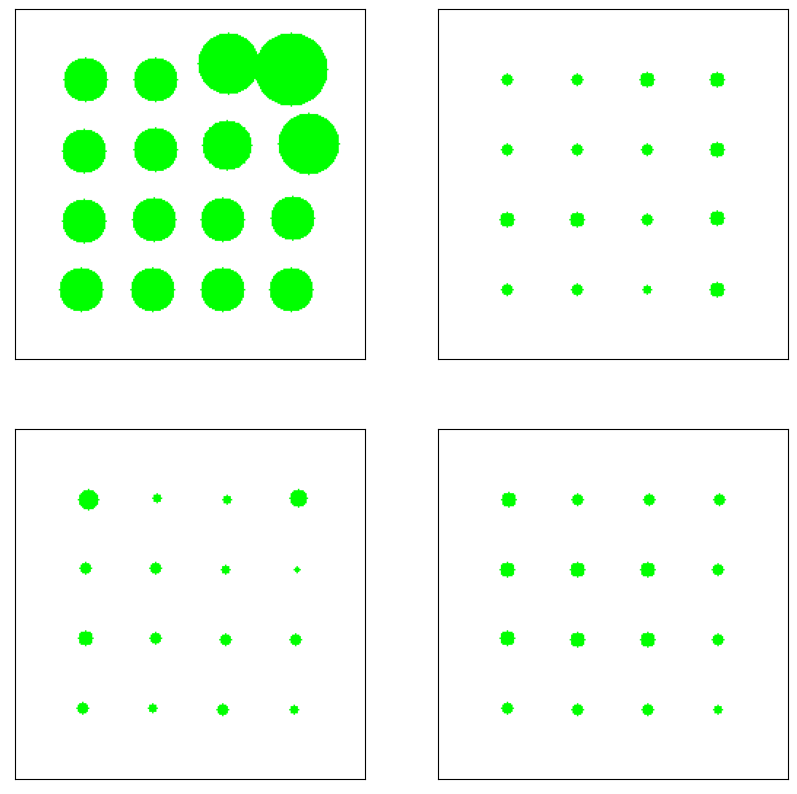

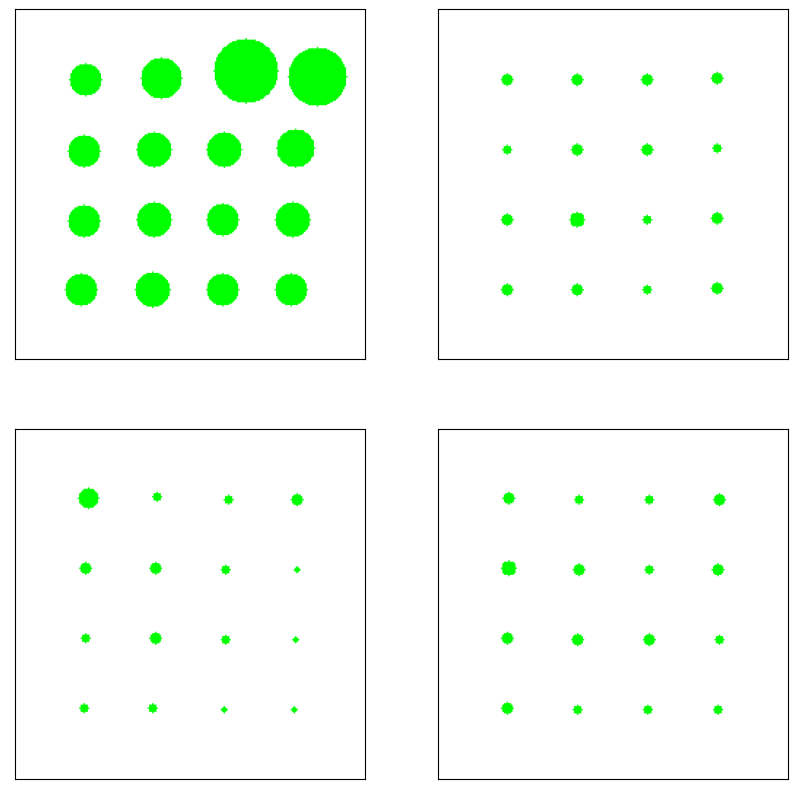

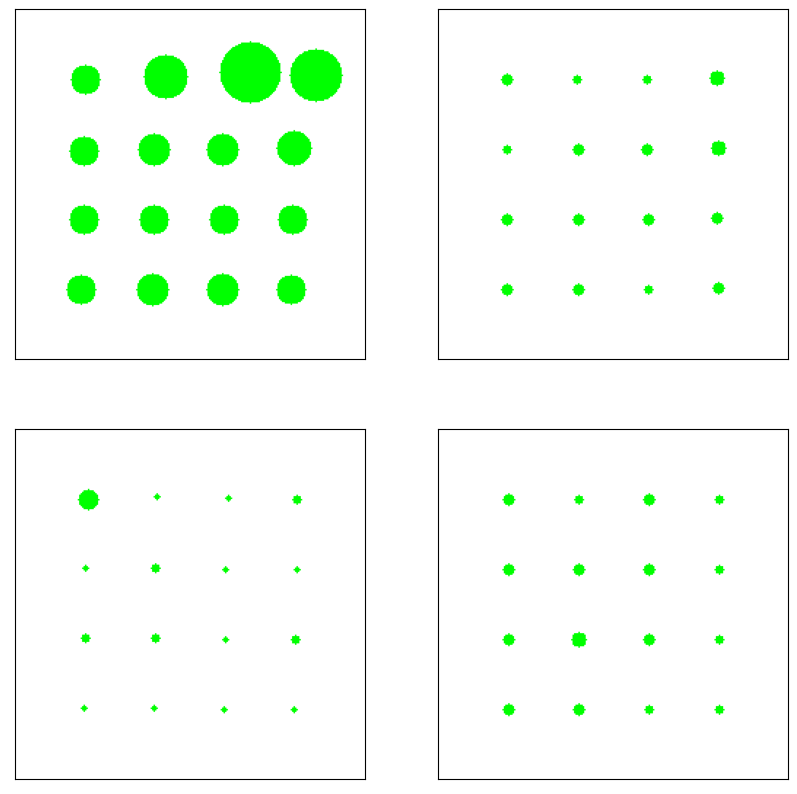

In [14]:
gif_maker = GIFMaker(
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/image/5'
)
cup_tactile_pad_ids = [(0,1),(1,0),(2,0),(3,0)]
gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(0,43),
    gif_name='cup_picking_image_rollout.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
    duration=11./43.
)

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

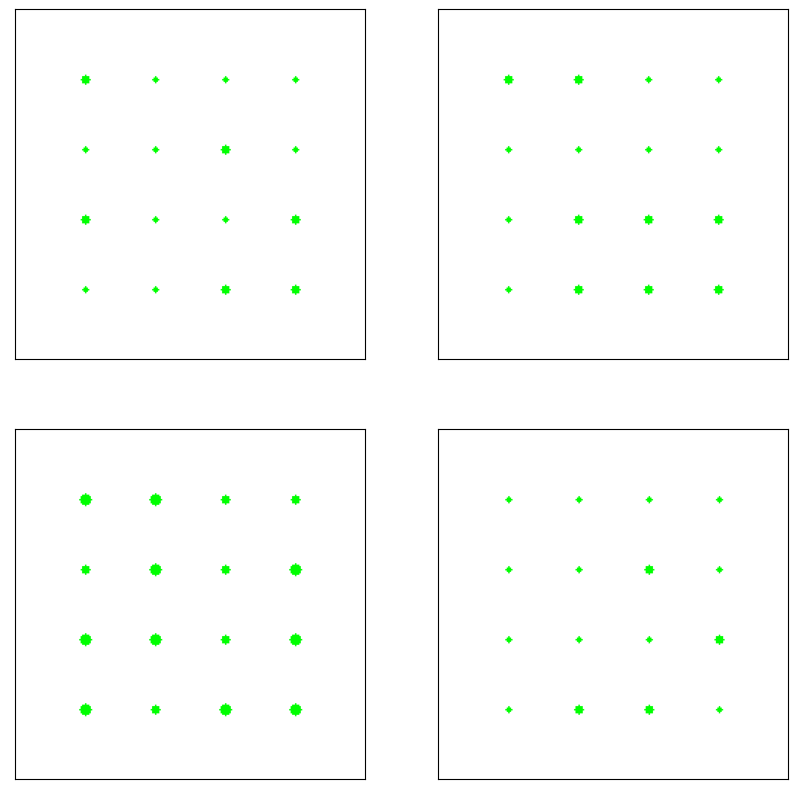

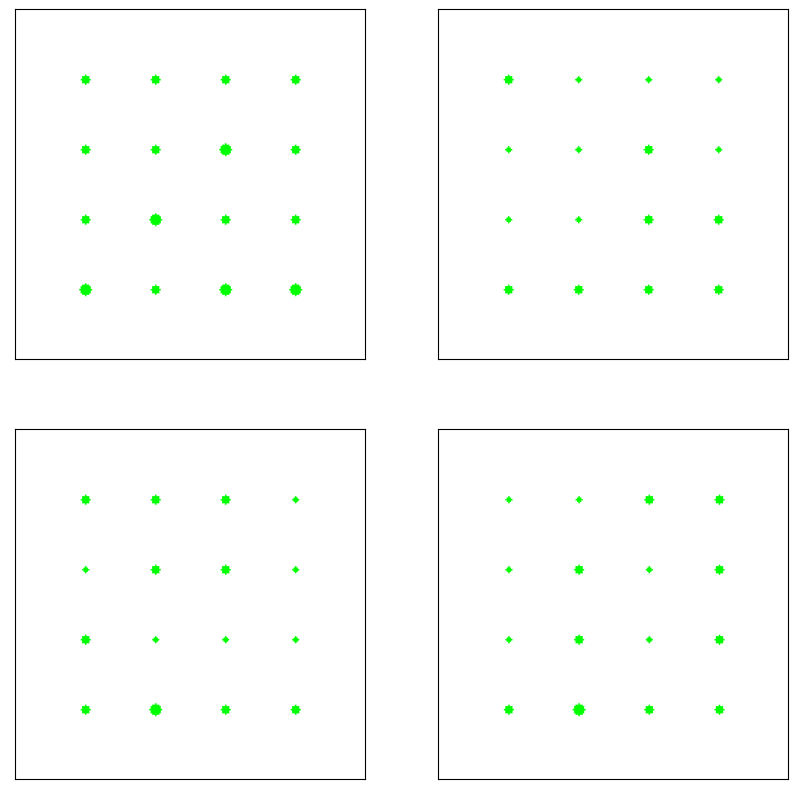

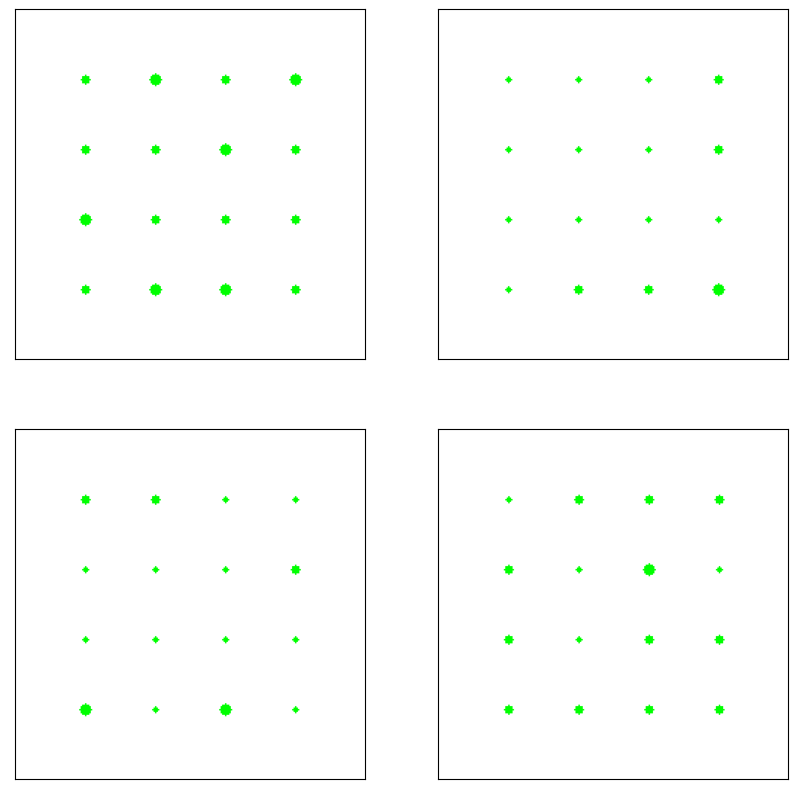

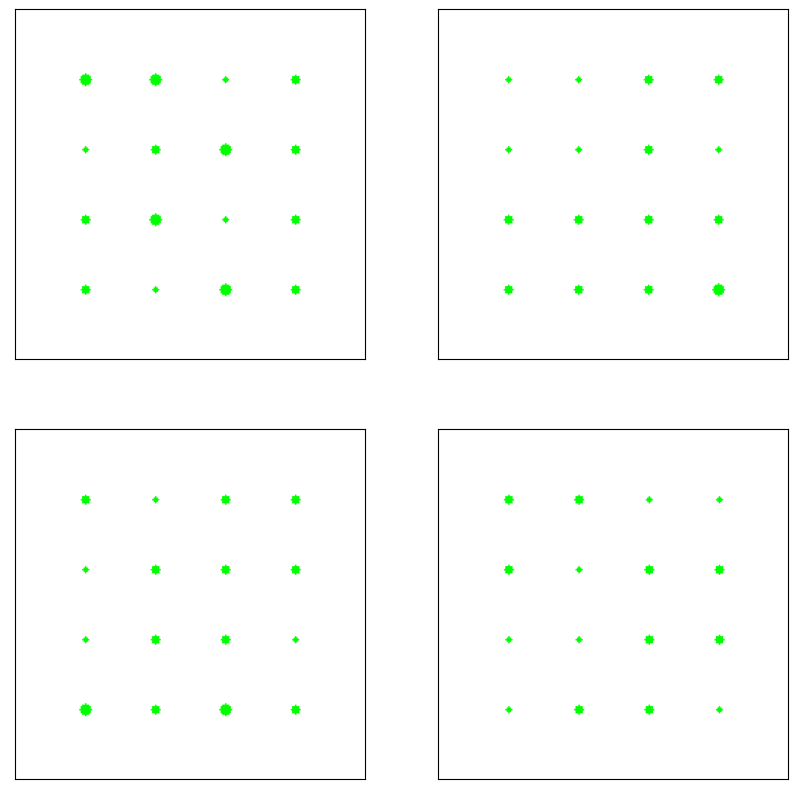

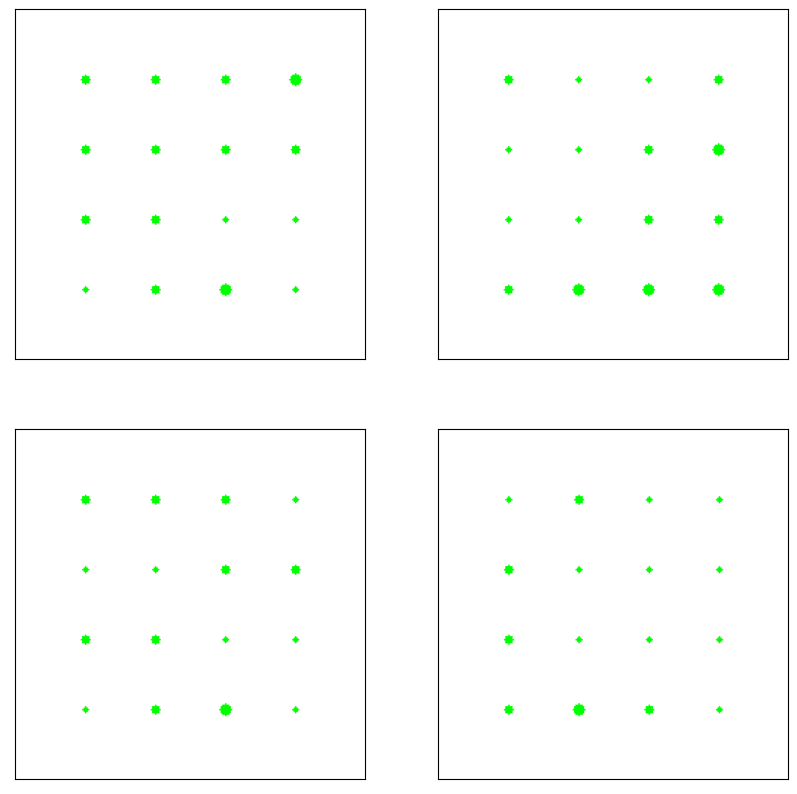

...

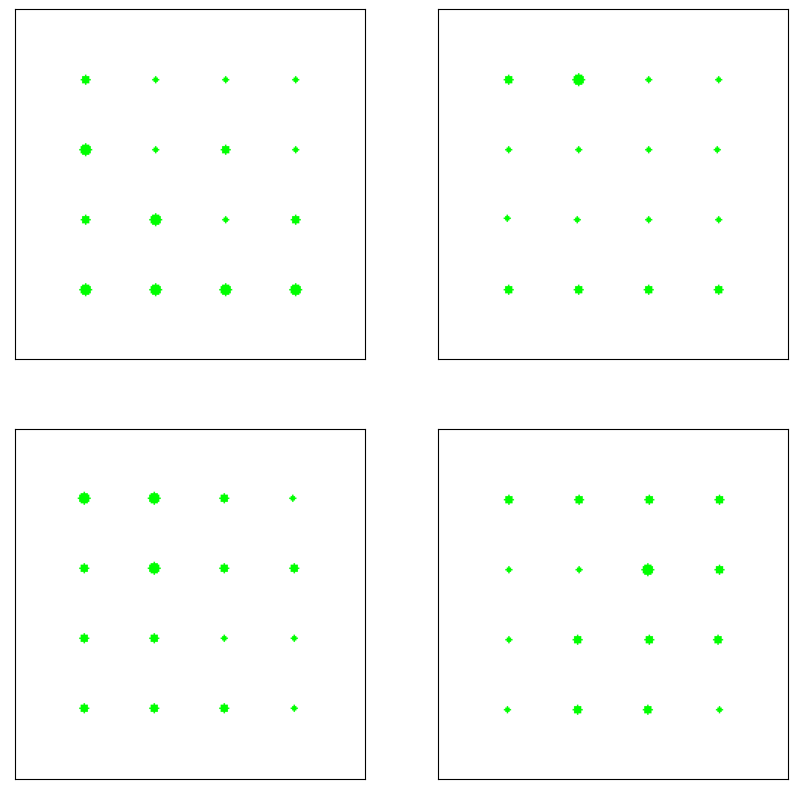

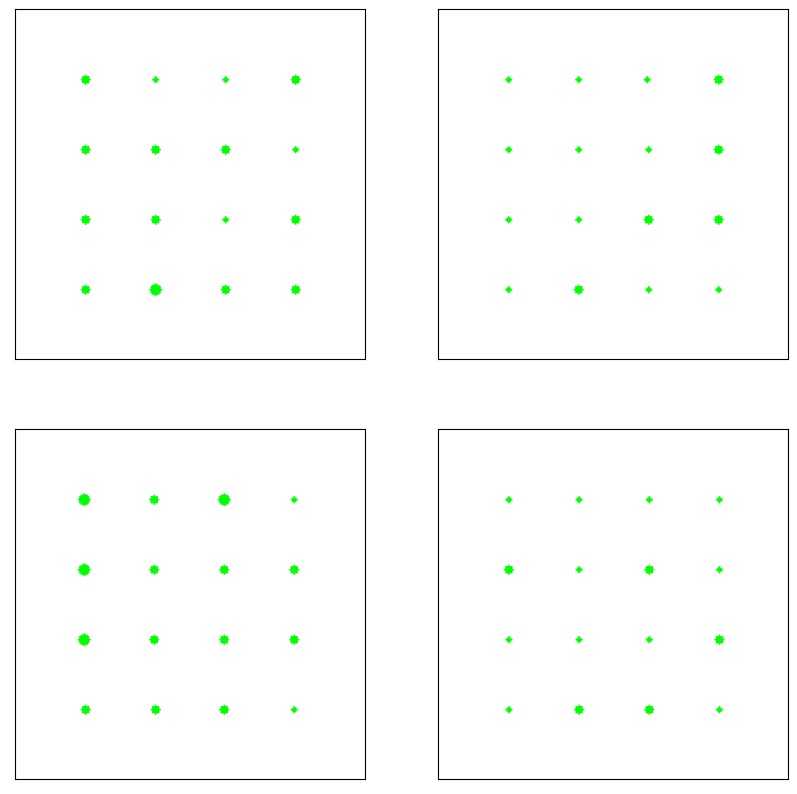

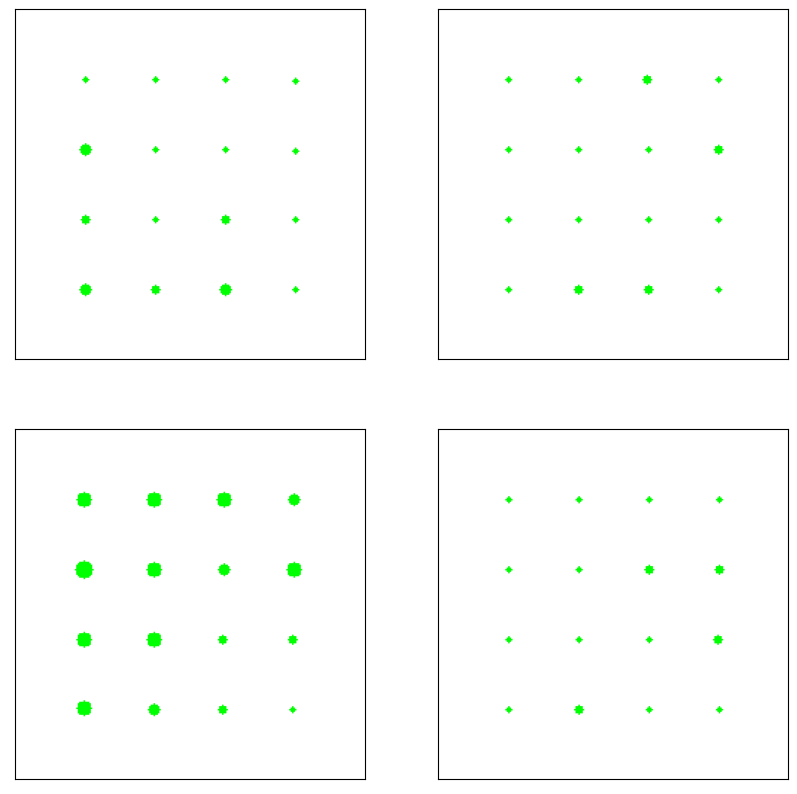

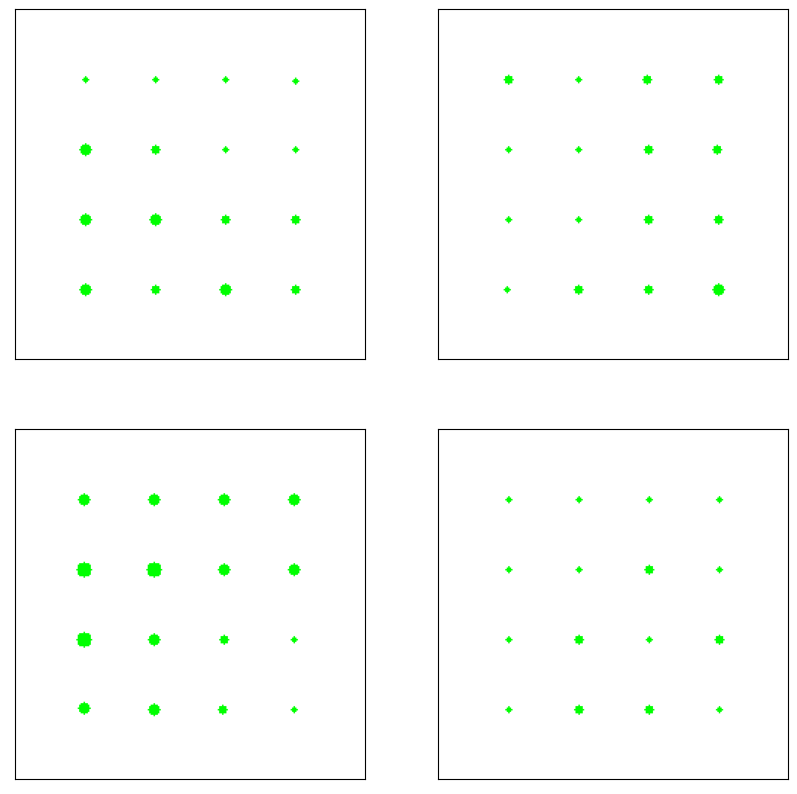

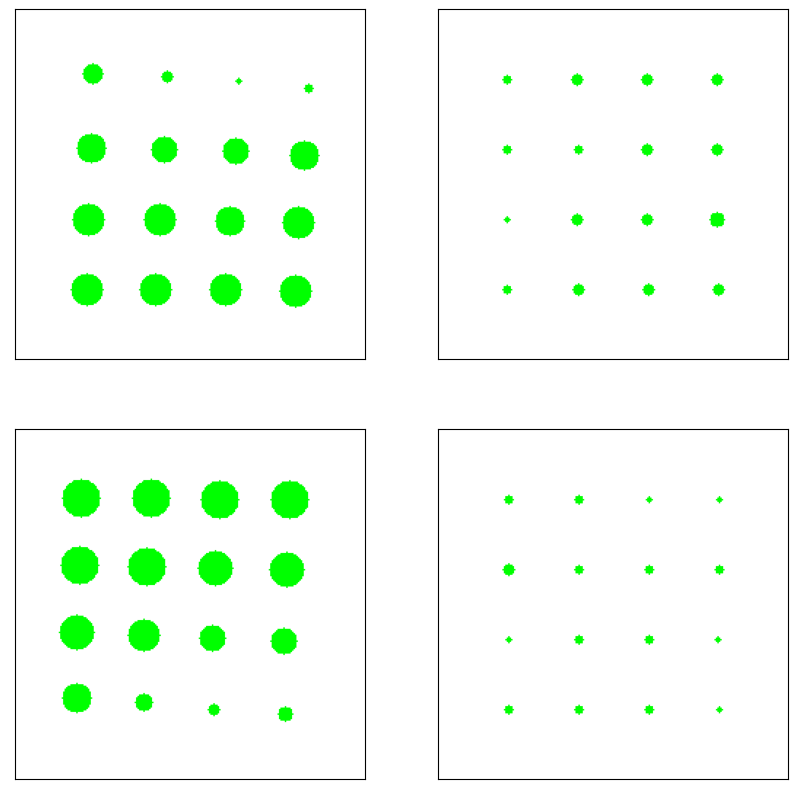

In [15]:
gif_maker = GIFMaker(
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/tactile/5'
)
cup_tactile_pad_ids = [(0,1),(1,0),(2,0),(3,0)]
gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(0,17),
    gif_name='cup_picking_tactile_rollout.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
    duration=5./17.
)

In [ ]:
# Bottle Cap Opening gifs
bottle_tdex_gif_maker = GIFMaker(
    demonstration_data_path = '/data/tactile_learning/bottle_cap_opening/eval',
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/bottle_cap_opening/demo_images/image_tactile_play/1'
)

# Make a gif of the current robot observations
# bottle_tdex_gif_maker.make_deployment_image_gifs(frame_ids = range(4), gif_name='bottle_tdex_curr_state_prev_sep.gif')
# bottle_tdex_gif_maker.make_deployment_image_gifs(frame_ids = range(4,20), gif_name='bottle_tdex_curr_state_after_sep.gif')
bottle_tdex_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(4),
    gif_name='bottle_tdex_curr_state_tactile_prev_sep.gif',
    tactile_pad_ids=[(1,0),(2,0),(2,1),(3,0)]
)
bottle_tdex_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(4,20),
    gif_name = 'bottle_tdex_curr_state_tactile_after_sep.gif',
    tactile_pad_ids = [(1,0),(2,0),(2,1),(3,0)]
)

# Image tactile play neighbor gifs
frame_ids = []
nn_ids = [0,1,0,0,0,0,3,0,0,1,0,0,2,2,2,5,2,0,0,2,3]
for i in range(20): 
    all_neighbor_ids = get_neighbor_ids(
        deployment_info = bottle_tdex_gif_maker.deployment_info,
        state_id = i)
    neighbor_id = all_neighbor_ids[nn_ids[i]]
    frame_ids.append(neighbor_id)
    
bottle_tdex_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids[:4], gif_name='bottle_tdex_nns_prev_sep.gif')
bottle_tdex_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids[4:], gif_name='bottle_tdex_nns_after_sep.gif')
bottle_tdex_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids[:4],
    gif_name = 'bottle_tdex_nns_tactile_prev_sep.gif',
    tactile_pad_ids = [(1,0),(2,0),(2,1),(3,0)])
bottle_tdex_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids[4:], 
    gif_name = 'bottle_tdex_nns_tactile_after_sep.gif',
    tactile_pad_ids = [(1,0),(2,0),(2,1),(3,0)])

In [ ]:
# Plot the image gifs
bottle_image_gif_maker = GIFMaker(
    demonstration_data_path = '/data/tactile_learning/bottle_cap_opening/eval',
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/bottle_cap_opening/demo_images/image/1'
)
frame_ids = []
image_nn_ids = [0,0,1,0,2,3,1,0,5,6,1,3,0,3,3,0,1,2,0,0,1]
for i in range(20): 
    all_neighbor_ids = get_neighbor_ids(
        deployment_info = bottle_image_gif_maker.deployment_info,
        state_id = i)
    neighbor_id = all_neighbor_ids[image_nn_ids[i]]
    frame_ids.append(neighbor_id)
bottle_image_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids[:4], gif_name='bottle_image_nns_prev_sep.gif')
bottle_image_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids[4:], gif_name='bottle_image_nns_after_sep.gif')
bottle_image_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids[:4],
    gif_name = 'bottle_image_nns_tactile_prev_sep.gif',
    tactile_pad_ids = [(1,0),(2,0),(2,1),(3,0)])
bottle_image_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids[4:], 
    gif_name = 'bottle_image_nns_tactile_after_sep.gif',
    tactile_pad_ids = [(1,0),(2,0),(2,1),(3,0)])

In [ ]:
# Main page tactile gifs
first_page_gif_maker = GIFMaker(
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/bowl_picking/demo_images/tdex_generalization/4'
)
cup_tactile_pad_ids = [(0,1),(1,0),(2,0),(3,0)]
first_page_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(0,26),
    gif_name='bowl_picking_first_page.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
    duration=12./26.
)


In [ ]:
# Main page tactile gifs
first_page_gif_maker = GIFMaker(
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/tdex_generalization/2'
)
cup_tactile_pad_ids = [(0,1),(0,2),(1,0),(1,3)]
first_page_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(32),
    gif_name='cup_picking_first_page.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
    duration=18./32.
)


In [33]:
# Make gifs for the play data
play_data_gif_maker = GIFMaker(
    demonstration_data_path = '/data/tactile_learning/play_data'
)

In [34]:
print(len(play_data_gif_maker.demo_data['image']['indices']))

29288


In [ ]:
for i in range(40,60): # We need 20 different gifs
    # if i > 16:
    play_data_gif_maker.make_demo_image_gifs(
        frame_ids = range(i*500, i*500+40, 2),
        gif_name = f'play_data_{i}.gif',
        view_num = 0
    )
    # print(range(i*2000-50, i*2000+50, 5))

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

IndexError: list index out of range

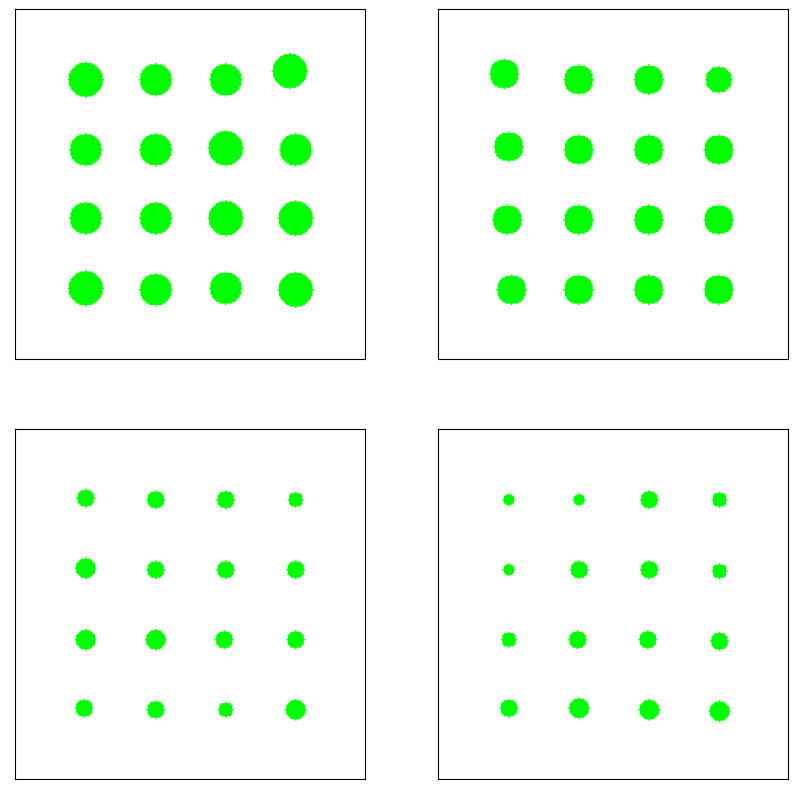

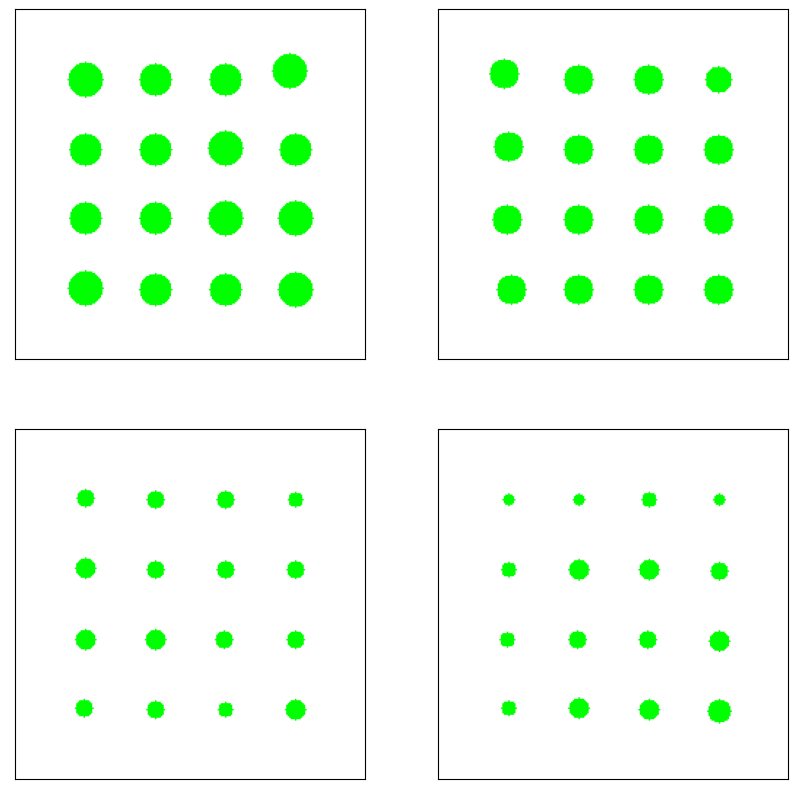

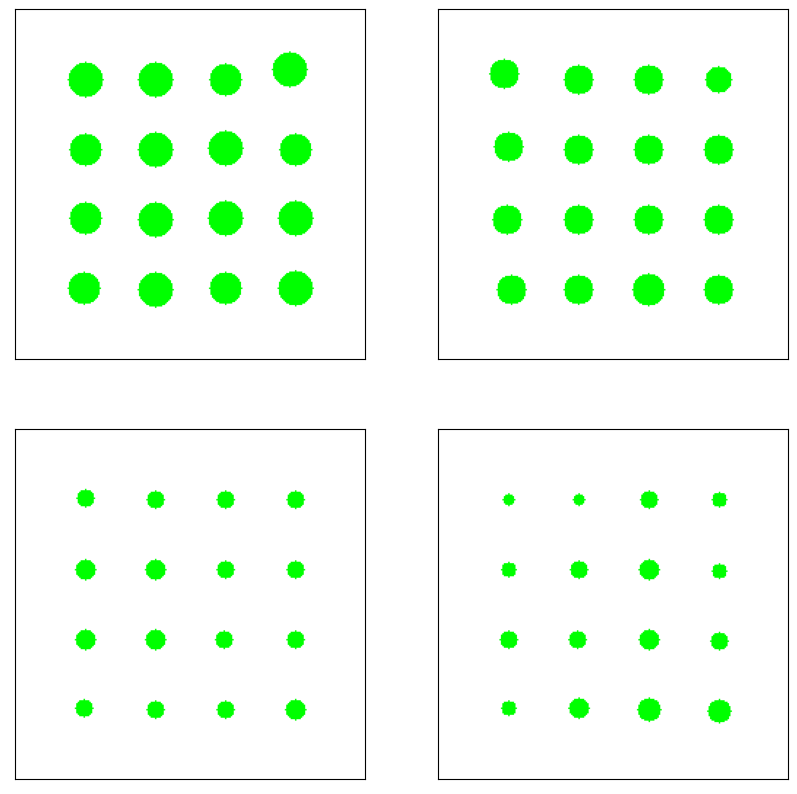

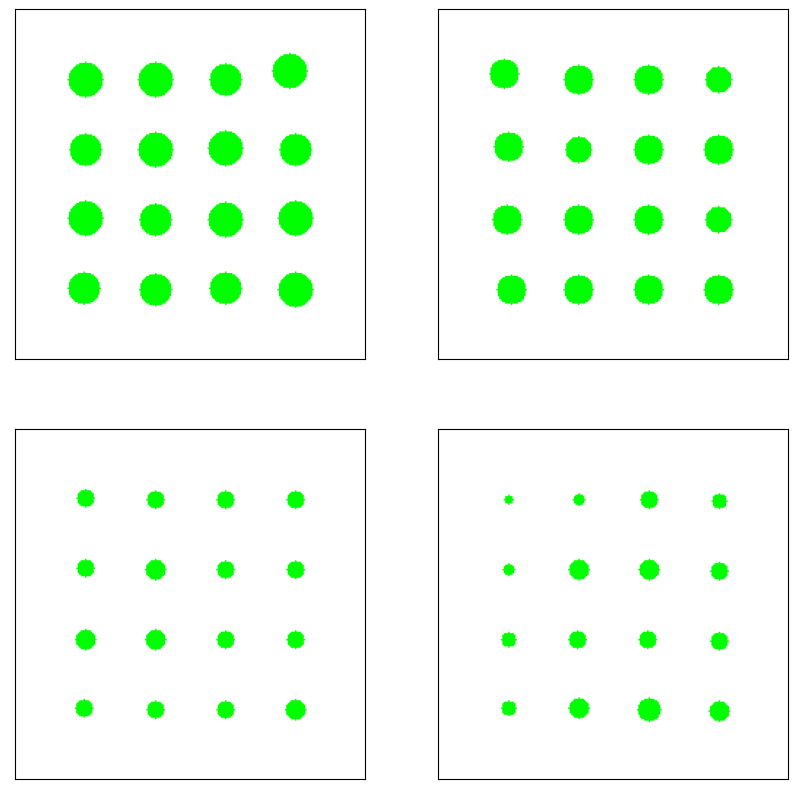

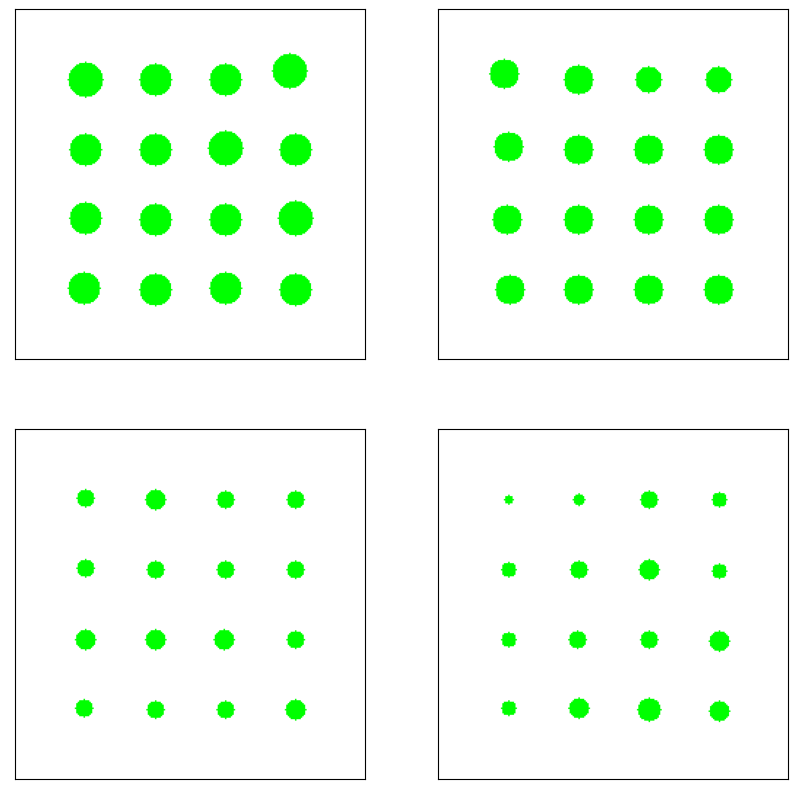

...

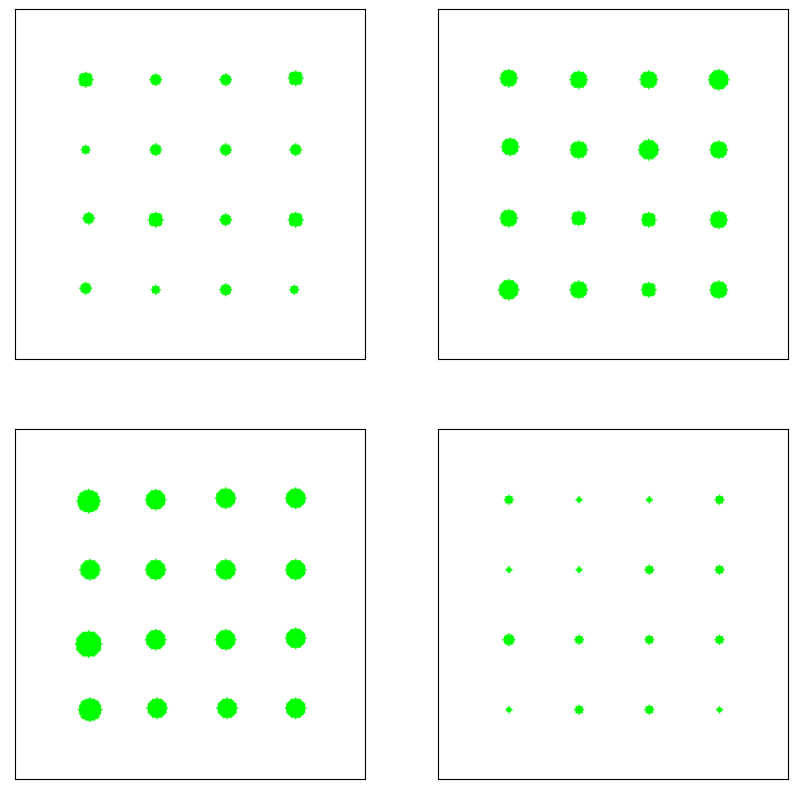

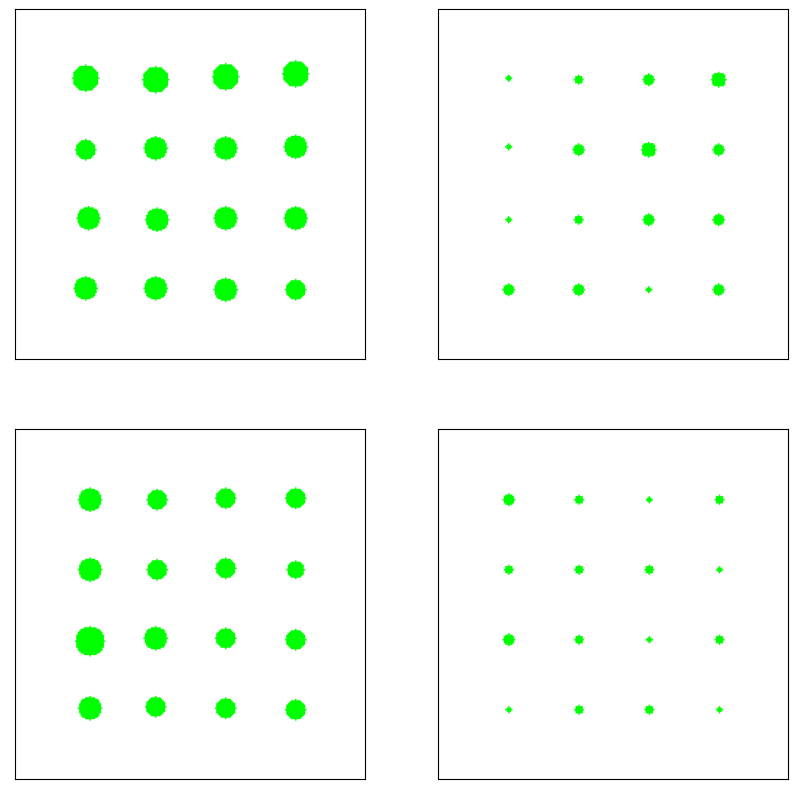

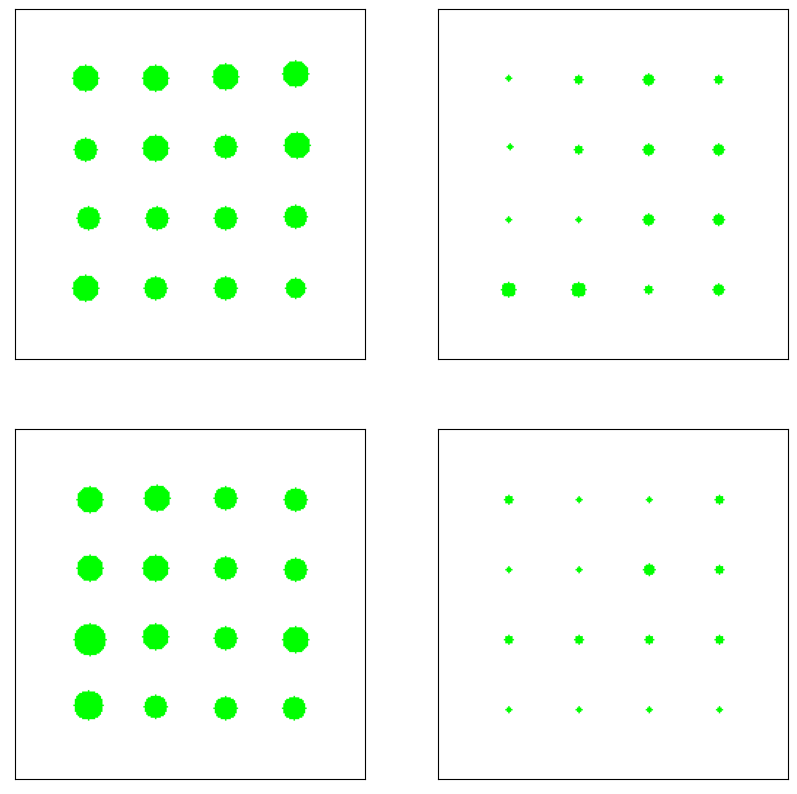

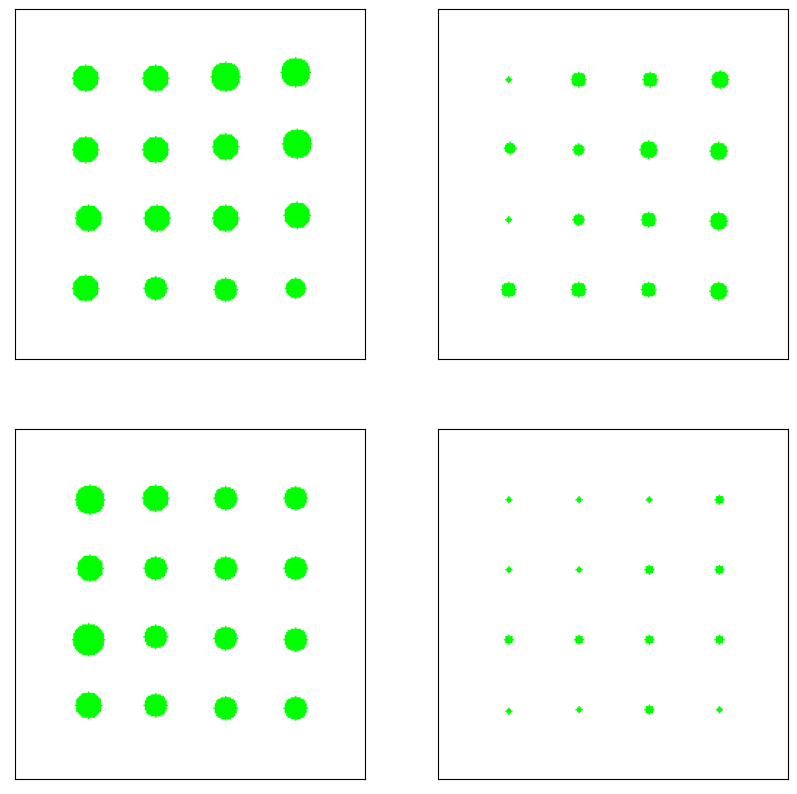

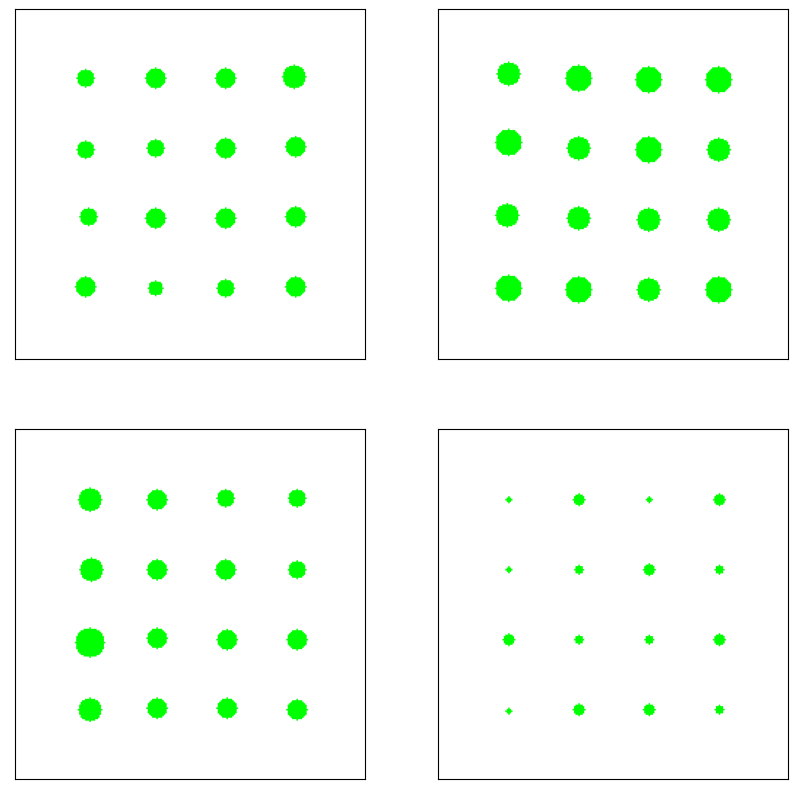

In [40]:
for i in range(40,70): # We need 20 different gifs
    # if i > 13:
    play_data_gif_maker.make_demo_tactile_gifs(
        frame_ids = range(i*500, i*500+40, 2),
        gif_name = f'play_data_tactile_{i}.gif',
        tactile_pad_ids = [(2,1),(1,0),(2,0),(3,2)],
        view_num=0
    )
    # print(range(i*2000-50, i*2000+50, 5))
    

In [133]:
data_path = '/data/tactile_learning/bottle_cap_opening/eval'
roots = glob.glob(f'{data_path}/demonstration_*')
data = load_data(roots)

In [134]:
len(data['tactile']['indices'])

310

In [ ]:
# Plot the image gifs
cup_tdex_gif_maker = GIFMaker(
    demonstration_data_path = '/home/irmak/Workspace/Holo-Bot/extracted_data/cup_picking/eval',
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/image_tactile_play/4'
)

cup_tactile_pad_ids = [(0,1),(0,2),(1,0),(1,3)]
frame_ids = []
nn_ids = [0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,6,2,0]
for i,state_id in enumerate(range(0,80,4)): 
    all_neighbor_ids = get_neighbor_ids(
        deployment_info = cup_tdex_gif_maker.deployment_info,
        state_id = state_id)
    # print(all_neighbor_ids)
    neighbor_id = all_neighbor_ids[nn_ids[i]]
    frame_ids.append(neighbor_id)
    
# Cup neighbors 
cup_tdex_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids[:4],
    gif_name='cup_tdex_nns_pre_sep.gif',
    view_num = 1
)
cup_tdex_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids[4:], gif_name='cup_tdex_nns_after_sep.gif', view_num=1
)
cup_tdex_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids[:4],
    gif_name = 'cup_tdex_nns_tactile_prev_sep.gif',
    tactile_pad_ids = cup_tactile_pad_ids,
    view_num=1
)
cup_tdex_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids[4:], 
    gif_name = 'cup_tdex_nns_tactile_after_sep.gif',
    tactile_pad_ids = cup_tactile_pad_ids,
    view_num=1
)

# Cup current stats
cup_tdex_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(0,16,4),
    gif_name='cup_tdex_curr_state_tactile_prev_sep.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
)
cup_tdex_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(16,80,4),
    gif_name = 'cup_tdex_curr_state_tactile_after_sep.gif',
    tactile_pad_ids = cup_tactile_pad_ids
)
cup_tdex_gif_maker.make_deployment_image_gifs(
    frame_ids = range(0,16,4), gif_name='cup_tdex_curr_state_prev_sep.gif')
cup_tdex_gif_maker.make_deployment_image_gifs(
    frame_ids = range(16,80,4), gif_name='cup_tdex_curr_state_after_sep.gif')


In [ ]:
cup_tactile_gif_maker = GIFMaker(
    demonstration_data_path = '/home/irmak/Workspace/Holo-Bot/extracted_data/cup_picking/eval',
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/tactile/4'
)

cup_tactile_pad_ids = [(0,1),(0,2),(1,0),(1,3)]
# frame_ids = []
# nn_ids = [0]
# for i,state_id in enumerate(range(0,80,4)): 
#     all_neighbor_ids = get_neighbor_ids(
#         deployment_info = cup_tactile_gif_maker.deployment_info,
#         state_id = state_id)
#     # print(all_neighbor_ids)
#     neighbor_id = all_neighbor_ids[nn_ids[i]]
#     frame_ids.append(neighbor_id)
    
# # Cup neighbors 
# cup_tactile_gif_maker.make_demo_image_gifs(
#     frame_ids = frame_ids[:4],
#     gif_name='cup_tactile_nns_pre_sep.gif',
#     view_num = 1
# )
# cup_tactile_gif_maker.make_demo_image_gifs(
#     frame_ids = frame_ids[4:], gif_name='cup_tactile_nns_after_sep.gif', view_num=1
# )
# cup_tactile_gif_maker.make_demo_tactile_gifs(
#     frame_ids = frame_ids[:4],
#     gif_name = 'cup_tactile_nns_tactile_prev_sep.gif',
#     tactile_pad_ids = cup_tactile_pad_ids,
#     view_num=1
# )
# cup_tactile_gif_maker.make_demo_tactile_gifs(
#     frame_ids = frame_ids[4:], 
#     gif_name = 'cup_tactile_nns_tactile_after_sep.gif',
#     tactile_pad_ids = cup_tactile_pad_ids,
#     view_num=1
# )
# Cup current stats
cup_tactile_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(0,16,4),
    gif_name='cup_tactile_nns_tactile_prev_sep.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
)
cup_tactile_gif_maker.make_deployment_tactile_gifs(
    frame_ids = range(16,40,2),
    gif_name = 'cup_tactile_nns_tactile_after_sep.gif',
    tactile_pad_ids = cup_tactile_pad_ids
)
cup_tactile_gif_maker.make_deployment_image_gifs(
    frame_ids = range(0,16,4), gif_name='cup_tactile_nns_prev_sep.gif')
cup_tactile_gif_maker.make_deployment_image_gifs(
    frame_ids = range(16,40,2), gif_name='cup_tactile_nns_after_sep.gif')

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

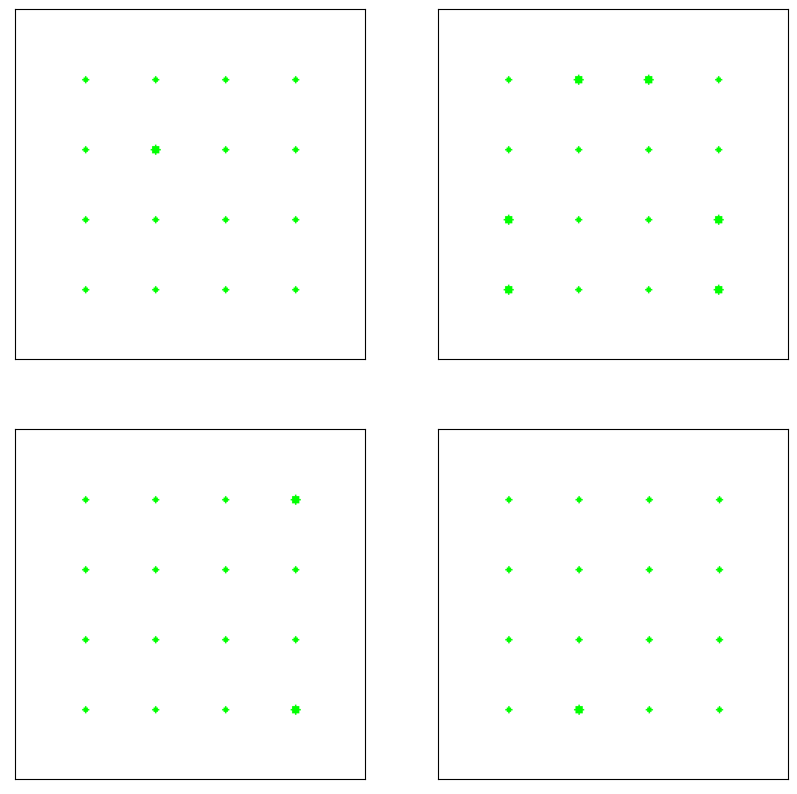

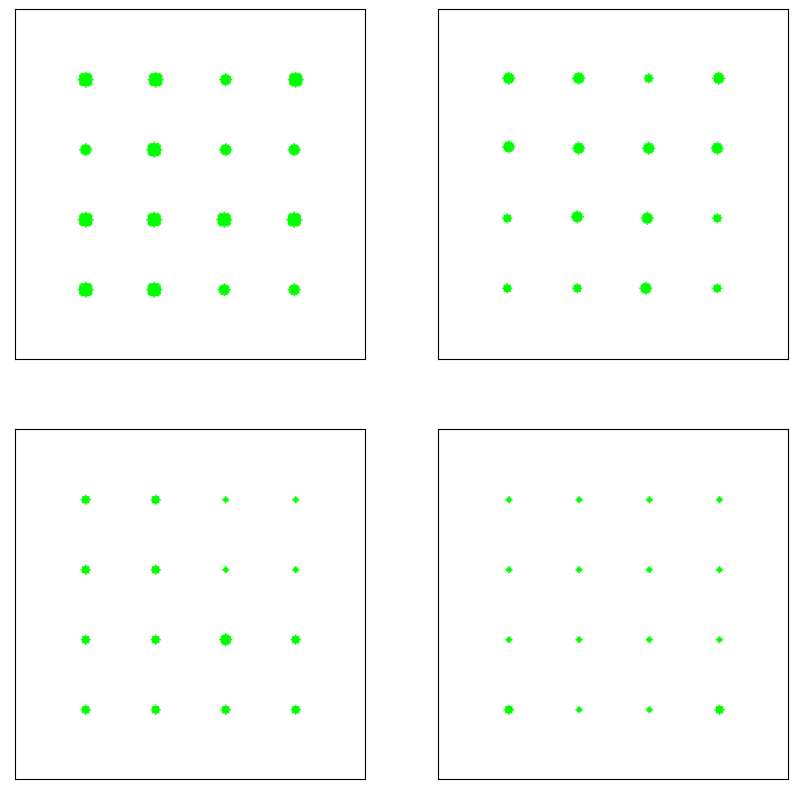

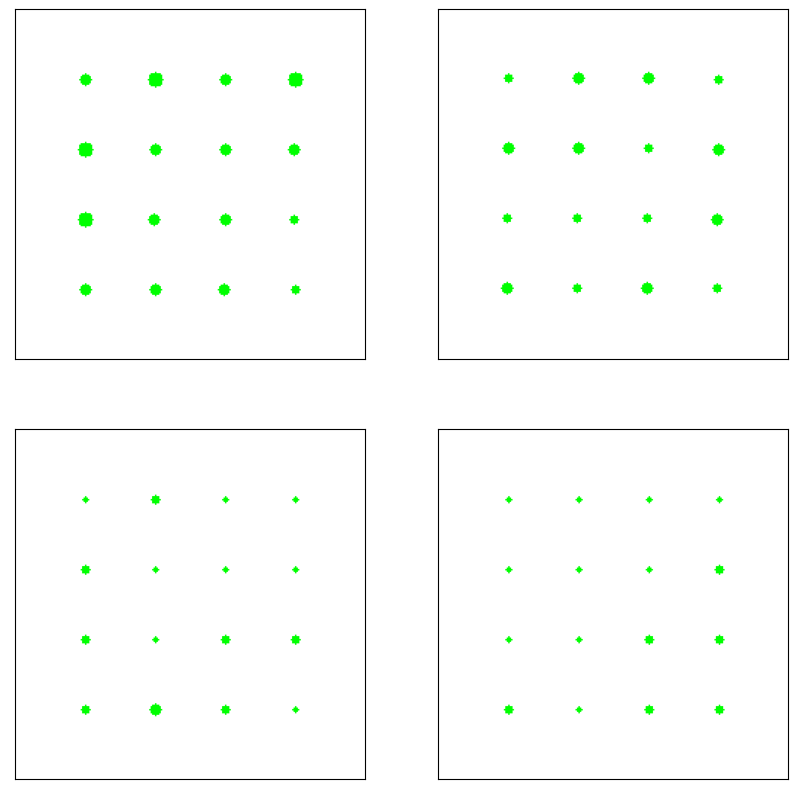

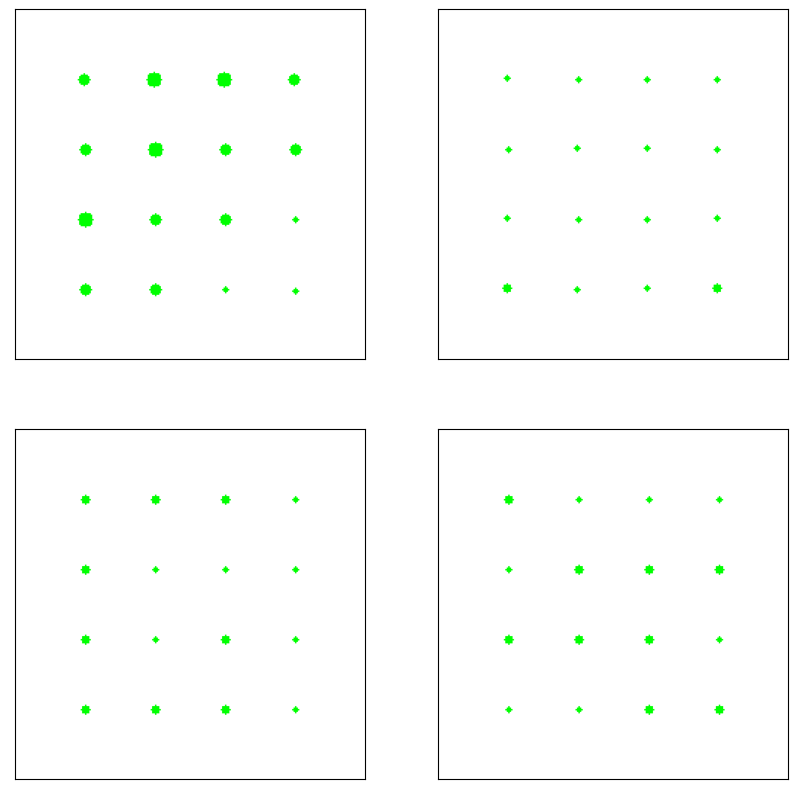

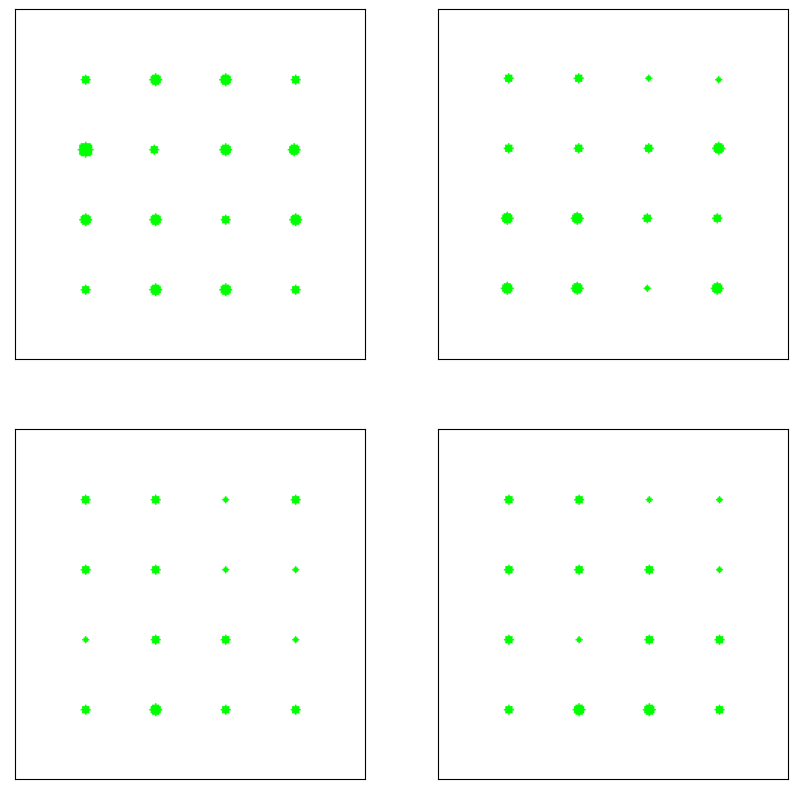

...

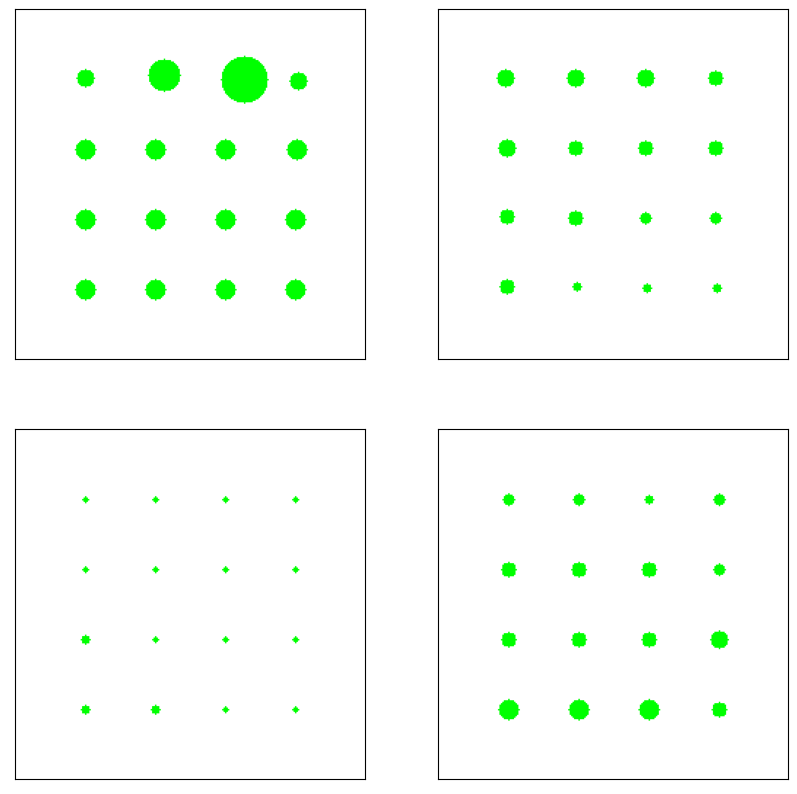

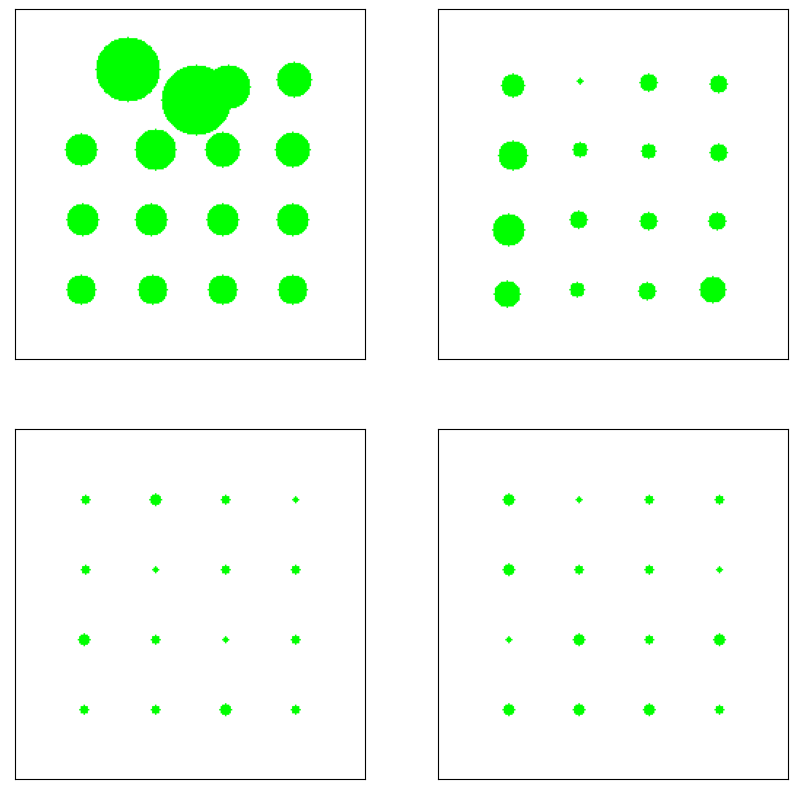

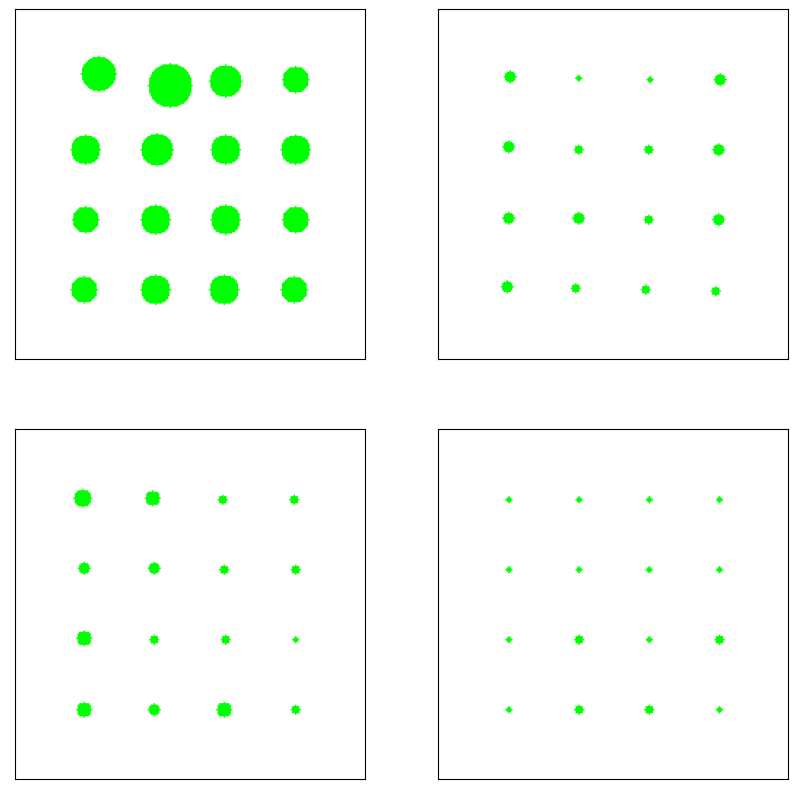

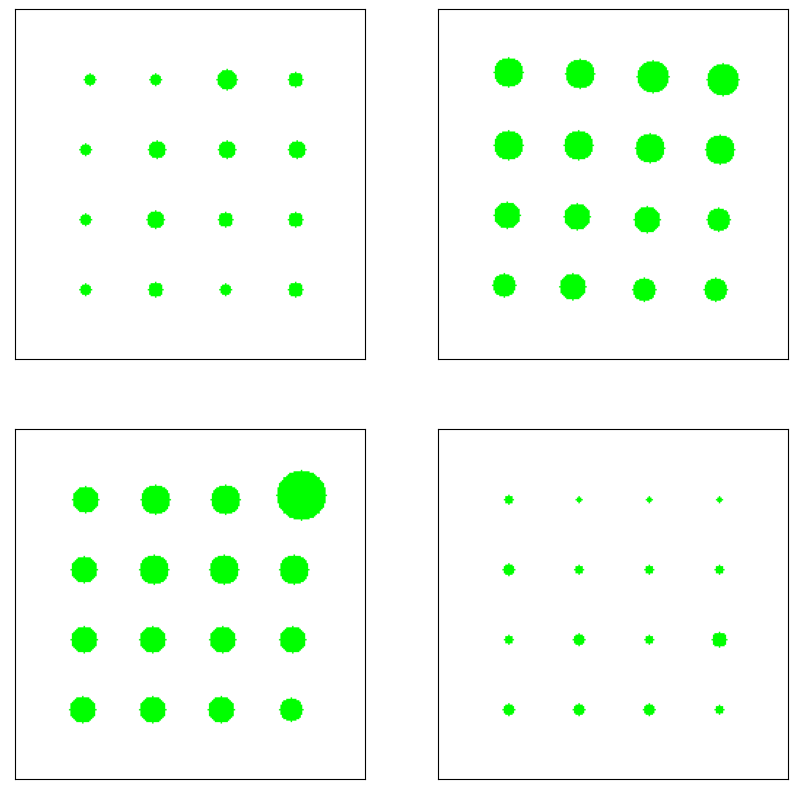

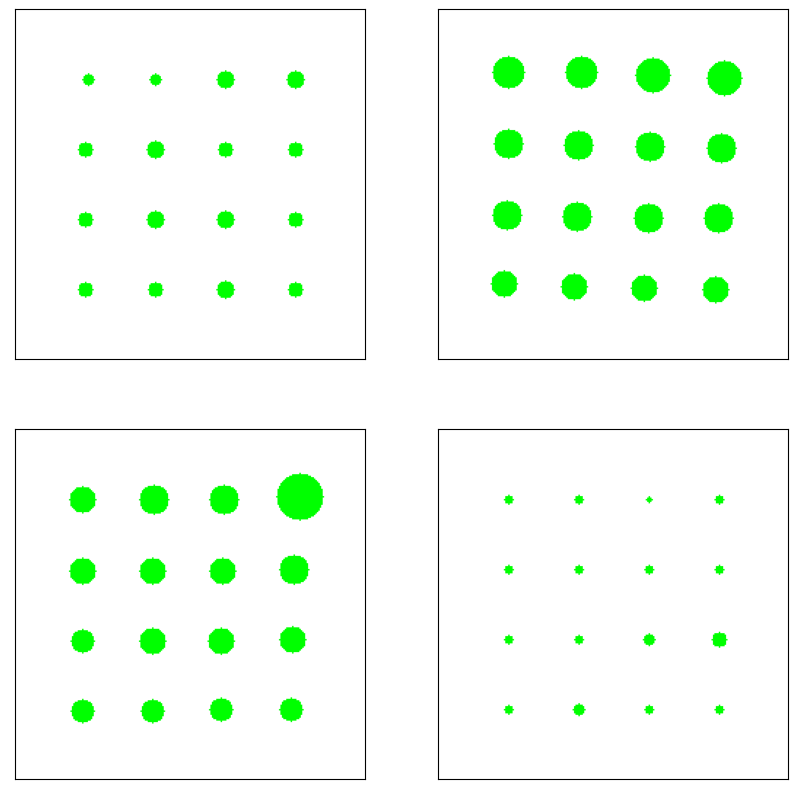

In [167]:
# Gif for the first page video play doh cup picking
cup_tactile_gif_maker = GIFMaker(
    demonstration_data_path = '/home/irmak/Workspace/Holo-Bot/extracted_data/cup_picking/eval',
    deployment_info_dir = '/home/irmak/Workspace/Holo-Bot/deployment_data/cup_picking/demo_images/tdex_generalization/2'
)

cup_tactile_pad_ids = [(0,1),(0,2),(1,0),(1,3)]
frame_ids = []
desired_state_ids = [0,3,6,13,16,18,23,26,30,32]
nn_ids = [0,0,0,0,0,0,0,0,2,0]
for i,state_id in enumerate(desired_state_ids):  # These are the desired ones
    all_neighbor_ids = get_neighbor_ids(
        deployment_info = cup_tactile_gif_maker.deployment_info,
        state_id = state_id)
    # print(all_neighbor_ids)
    neighbor_id = all_neighbor_ids[nn_ids[i]]
    frame_ids.append(neighbor_id)
    
# Cup neighbors 
cup_tactile_gif_maker.make_demo_image_gifs(
    frame_ids = frame_ids,
    gif_name='playdoh_tdex_nns.gif',
    view_num = 1
)
cup_tactile_gif_maker.make_demo_tactile_gifs(
    frame_ids = frame_ids,
    gif_name = 'playdoh_tdex_nns_tactile.gif',
    tactile_pad_ids = cup_tactile_pad_ids,
    view_num=1
)
# Cup current stats
cup_tactile_gif_maker.make_deployment_tactile_gifs(
    frame_ids = desired_state_ids,
    gif_name='playdoh_curr_states_tactile.gif',
    tactile_pad_ids=cup_tactile_pad_ids,
)
cup_tactile_gif_maker.make_deployment_image_gifs(
    frame_ids = desired_state_ids, gif_name='playdoh_curr_states.gif')